### Individual Assignment 

In [52]:
from dcr import *

## 1A - Explain qualitatively  the role of borrower income on credit risk prediction.

In Order to explain this quantitatively, I will use an example. Let's imagine there is a household that has a monthly cumulative paycheck earned by the members of the household for its survival. A higher and more stable income directly improves a family's ability to cover their mortgage payment simply because it provides a larger financial buffer. This buffer acts as a safety net so that an unexpected car repair or medical bill will not cause them to miss their periodic loan payment. The stability directly reduces their personal probability of default. 
Now if we zoom out to a national level, we can see how incomes rising across an entire state signals thriving economy when jobs are secure. This widespread prosperity makes it less likely for many people to default at once and also supports a stable housing market. This positive economic environment is actually crucial for banks because it lowers risk across its entire loan portfolio. A borrower's income is not just about personal finances, it is also a window into the health of the entire economy they live in which ultimately determines the bank's risk.
Beyond the absolute level, the stability and source of income is definitely extremely important. A consistent salary from a stable employer is viewed far more favorably than a volatile non regular income from a seasonal or casual employer even if they yearly average is the same. This is because income volatility increases the likelihood of short term liquidity issues which could be the reason for default.
On a larger macroeconomic scale, aggregated income growth can clearly act as a proxy for economic health of the state or the nation. Positive income growth is correlated with low employment, consumer confidence and especially for mortgages a stable or appreciating housing market. A slowdown in income growth can be an early warning sign of economic downturn which immediately poses a risk to lender's portfolios. Therefore, incorporating income data, both at the individual and national level allows credit risk models to be more dynamic and sensitive to underlying economic conditions that drive defaults especially if their customers are mostly in one region or area.


### 1B - Describe the data using the describe method in pandas and plot the time series using matplotlib. Interpret all outputs economically. Interpolate missing years

Step 1: Loading the data...
Step 2: Preparing data columns...
Step 3: Generating descriptive statistics...
      count          mean           std      min      25%      50%      75%  \
2000   52.0  71413.269231  10839.526565  50290.0  64110.0  70930.0  79055.0   
2001   52.0  70728.269231  10863.925864  49620.0  63632.5  69560.0  77657.5   
2002   52.0  69969.615385  10622.488716  48490.0  62242.5  70045.0  76387.5   
2003   52.0  70256.346154  10333.574829  51770.0  62850.0  69725.0  77470.0   
2004   52.0  70224.807692  10131.222656  52670.0  63862.5  68845.0  76295.0   
...     ...           ...           ...      ...      ...      ...      ...   
2011   52.0  68243.461538   9968.967120  53670.0  60845.0  67065.0  74772.5   
2012   52.0  68687.692308  10917.826332  48410.0  60952.5  66740.0  75417.5   
2013   52.0  68917.115385  10725.466549  51720.0  60232.5  69130.0  76217.5   
2014   52.0  71039.038462  11738.117105  45720.0  63007.5  70290.0  78145.0   
2015   52.0  73420.57692

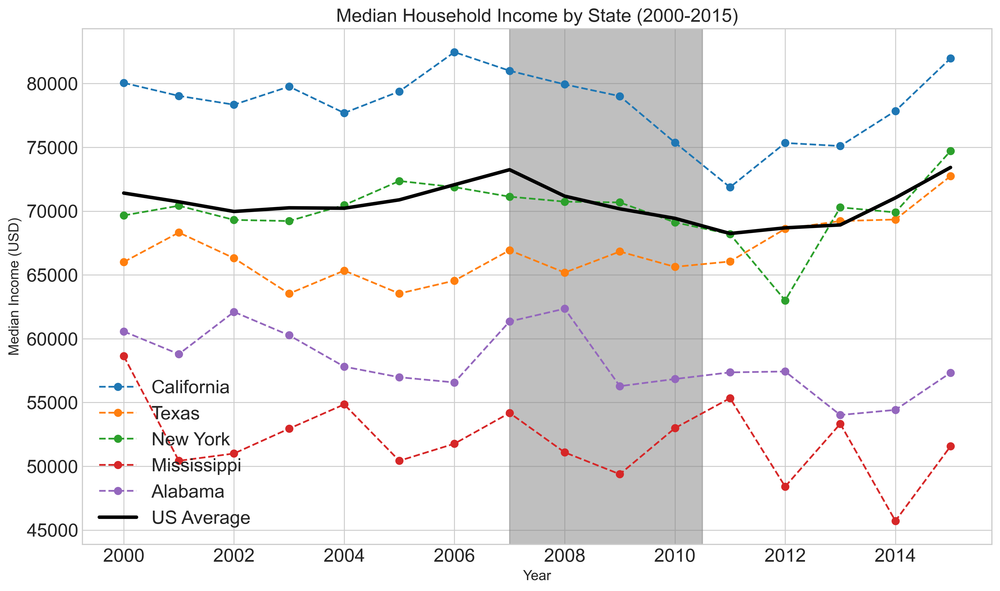

In [53]:
try:
    #Step 1: Load the Data
    print("Step 1: Loading the data...")
    income_df = pd.read_csv('Median_Income.csv')
    income_df.set_index('State', inplace=True)

    #Step 2: Identify and Prepare Data Columns
    print("Step 2: Preparing data columns...")
    year_columns = []
    for column_name in income_df.columns:
        if column_name.isnumeric():
            year_columns.append(column_name)
        
    #Step 3: Get a Statistical Summary
    print("Step 3: Generating descriptive statistics...")
    income_stats = income_df[year_columns].describe().transpose()
    print(income_stats)

    #Step 4: Create the Plot
    print("Step 4: Creating the time series plot...")
    plt.figure(figsize=(14, 8))
    
    states_to_plot = ['California', 'Texas', 'New York', 'Mississippi','Alabama']
    for state_name in states_to_plot:
        income_df.loc[state_name, year_columns].plot(label=state_name, marker='o', linestyle='--')
    income_df[year_columns].mean().plot(label='US Average', color='black', linewidth=3)

    plt.title('Median Household Income by State (2000-2015)', fontsize=16)
    plt.axvspan(7.0, 10.5, color="grey", alpha=0.5) # Shading from 2007 Q3[27] (index 7.0) to 2010 Q4 [40] (index 10.5)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Median Income (USD)', fontsize=12)
    plt.legend(loc="best")
    plt.grid(True)    
    plt.show()
# Clears shows the error instead of full error message
except Exception as e:
    print(f"An unexpected error occurred: {e}")


The table and graph from the analysis shows the financial health of american families between 2000 and 2015. They tell a clear story about the US economy during this time which broadly shows a period of growth followed by a major crisis in 2008 followed by a slow recovery.
The describe() table gives us an overview of the entire U.S. economy. 
The most important number is the mean or average income which clearly shows that from 2000 to 2007 average income went up. This was a time of economic growth fueled by a strong housing market where prices were high and it was easy to get loans. 2008 to 2012 was when average incomes fell sharply and stayed low. This is a direct result of the 2008 Global Financial Crisis (GFC). The housing market crashed leading to massive job losses and pay cuts across the country. The economy was in a deep recession and families had less money. 2013 to 2015 was when average income started to slowly rise again as the economy and the job market began to heal from the crisis.
The standard deviation figures are also very important. This number measures how spread out the incomes are between the different states. The standard deviation is very large, (well over $10,000) which tells us that there is a huge economic gap between the rich and poor states. The US is not a single economy it is a collection of many different ones. The Min and Max value shows this clearly with the richest states earning nearly double the income of the poorest. For a bank this means that the risk of lending money is significant depending on which state the borrower lives in.
The graph shows how these big economic events affected individual states in unique ways based on their local industries.
The US average which is the black line shows the overall story of growth, a sharp crash and slow recovery. California and New York are high income states but their economies are also extremely volatile. New York is the center of the US finance industry. California has huge tech industry and a massive real estate market. Both states were at the heart of the 2008 crisis. When the financial and housing markets collapsed these states suffered massive job losses and their incomes fell much faster than the national average they also recovered strongly after 2012 as those same industries bounced back. Texas tells a different story. Texas has a massive oil and gas industry. During the 2008 crisis global oil prices were high. This created a shale oil boom in Texas which protected its economy from the worst of the recession that was hurting other states. This is a perfect example of why state specific industries matter so much for risk. Alabama and Mississippi show the economic reality of the deep south. Their economies are more reliant on traditional industries like manufacturing (cars in Alabama) and agriculture which include cotton and soybeans as well as forestry. The income of these states are consistently below the US average. While they were hurt by the 2008 crisis, their economies did not experience the wild boom and bust cycle of the coastal states. For lenders, the risk here is very different. It's not the risk of a sudden sharp crash but a constant risk related to lower average incomes which means families have less of a financial cushion to handle unexpected problems.


### 1C

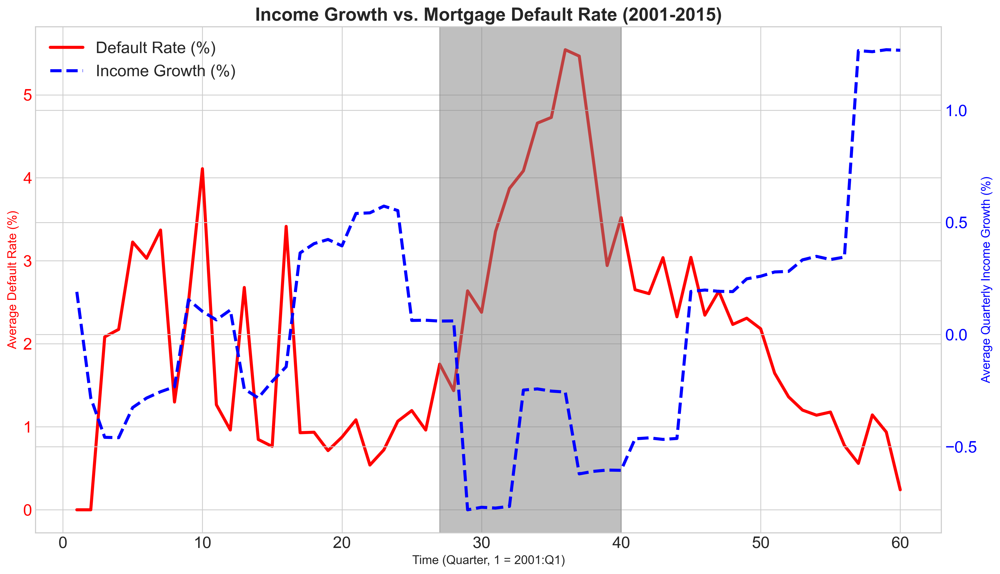

In [54]:
try:
    # Step 1: Load and Prepare the Data
    mortgage_data = pd.read_csv('dcr.csv')
    income_growth_data = pd.read_csv('Income_Growth.csv')
    
    income_growth_data.rename(columns={'Time': 'time',
                                       'State': 'state_orig_time',
                                       'Income Growth': 'income_growth'}, inplace=True)

    income_growth_data.drop_duplicates(subset=['time', 'state_orig_time'], inplace=True)
    
    merged_df = pd.merge(mortgage_data, income_growth_data, on=['time', 'state_orig_time'], how='left')
    
    # Step 2: Calculate Averages for Each Time Period
    average_income_growth_by_time = merged_df.groupby('time')['income_growth'].mean()
    average_default_rate_by_time = merged_df.groupby('time')['default_time'].mean()

    time_analysis_df = pd.DataFrame({
        'avg_income_growth': average_income_growth_by_time,
        'default_rate': average_default_rate_by_time
    })

    # Step 3: Create the Plot
    fig, ax1 = plt.subplots(figsize=(16, 9))
    
    # Step 3.1: Plotting the Default Rate
    default_rate_color = 'red'
    ax1.set_xlabel('Time (Quarter, 1 = 2001:Q1)', fontsize=12)
    ax1.set_ylabel('Average Default Rate (%)', color=default_rate_color, fontsize=12)
    ax1.plot(time_analysis_df.index, time_analysis_df['default_rate'] * 100, color=default_rate_color, linewidth=3, label='Default Rate (%)')
    ax1.tick_params(axis='y', labelcolor=default_rate_color)

    # Step 3.2: Plotting the Income Growth
    ax2 = ax1.twinx()
    income_growth_color = 'blue'
    ax2.set_ylabel('Average Quarterly Income Growth (%)', color=income_growth_color, fontsize=12)
    ax2.plot(time_analysis_df.index, time_analysis_df['avg_income_growth'] * 100, color=income_growth_color, linestyle='--', linewidth=3, label='Income Growth (%)')
    ax2.tick_params(axis='y', labelcolor=income_growth_color)   
    plt.title('Income Growth vs. Mortgage Default Rate (2001-2015)', fontsize=18, fontweight='bold')
    plt.axvspan(27, 40, color="grey", alpha=0.5)
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left')    
    plt.show()

except Exception as e:
    print(f"An unexpected error occurred: {e}")

The graph created here shows a very clear story of the relationship between credit risk which is the link between health of the economy and the borrower's ability to pay their mortgage. 
The graph clearly shows that income growth and mortgage defaults are mirror images of each other. To understand this with an example we can think of the economy and the mortgage defaults as a seesaw. The blue dashed line is the average quarterly income growth that measures the economy's health. When this line is above zero and rising it means families are on average earning more money. The economy is strong.
The red line is the average default rate. This is the percentage of people who are failing to pay their mortgage. When this line is rising, it is a sign of widespread financial trouble.
The graph explains the story that can be broken down into three parts:
in the first part of the graph, the blue line which is income growth is almost always positive. This was a period of economic expansion. Businesses were hiring and people's paychecks were growing. Because families had stable growing incomes, they could easily afford their mortgage payments. As a direct result, the red line which is the default rate is low and flat. There was very little financial stress during this time.
The 2008 to 2010 period is the most dramatic part of the graph, the blue line which is the income growth suddenly dives and goes sharply negative. This is the 2008 global financial crisis. The housing market crashed and the entire economy went into a deep recession. Millions of people lost their jobs and their income disappeared. The collapse in income is the direct cause of the huge sharp spike we see in the red line which is the default rate.
After the crisis, the economy slowly began to heal. The blue line climbs back up and becomes positive again. As families start earning money again, they could once more afford to pay and make their payments. This direct result is that the red line begins to fall steadily.
The graph shows the average income growth for the whole country but this average is misleading. It hides the real story of risk which is found in the heterogeneity of the US economy. This means that the economy is very different from one state to another. The US is not one single economy, it is a collection of 50 different state economies each with its own key industries that behave differently. The graph shows that on average the economy was hit hard but it doesn't show that some states were hit much harder than others.
To try and understand the 2008 crisis and this heterogeneity concept a little better we can look at the following examples:
Example 1 - Michigan: Michigan's economy depends heavily on the auto industry. During the GFC, no one was buying cars and the major auto companies almost went bankrupt which led to massive layoffs and the income growth in Michigan was far worse than the national average. A borrower in Michigan was in extreme danger of losing their job and defaulting on their loans.
Example 2 – Texas: At the same time, Texas’s economy was being protected by its huge oil and gas industry. Global oil prices were high which meant the energy sector in Texas was still strong and hiring. The economic pain was much less severe. A borrower in Texas was in a much safer economic environment.
This is why heterogeneity is so important. As a lender looking only at the national average can make you feel safe but the real risk is hidden and concentrated in specific states. The graph proves the big picture relationship which is when incomes fall, defaults rise but the concept of heterogeneity teaches us that to truly manage risk we must look deeper at local economies where our borrowers actually live and work and plan to offset the default risk accordingly.


### 2A

Optimization terminated successfully.
         Current function value: 0.113367
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:           default_time   No. Observations:                62178
Model:                          Logit   Df Residuals:                    62175
Method:                           MLE   Df Model:                            2
Date:                Fri, 24 Oct 2025   Pseudo R-squ.:                 0.01563
Time:                        21:16:07   Log-Likelihood:                -7049.0
converged:                       True   LL-Null:                       -7160.9
Covariance Type:            nonrobust   LLR p-value:                 2.552e-49
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -2.4153      0.331     -7.292      0.000      -3.065      -1.766
FICO_orig_time   

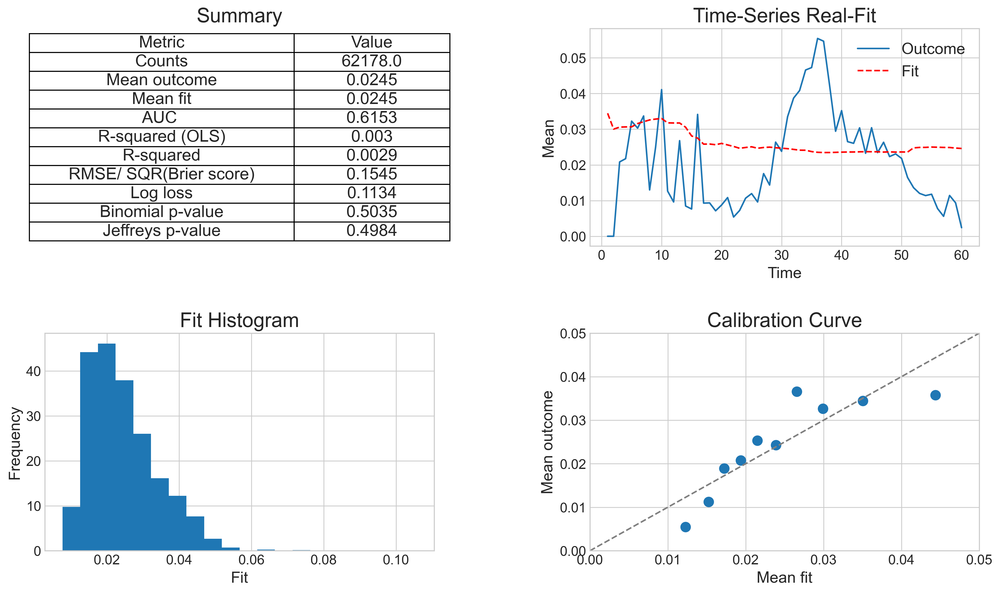

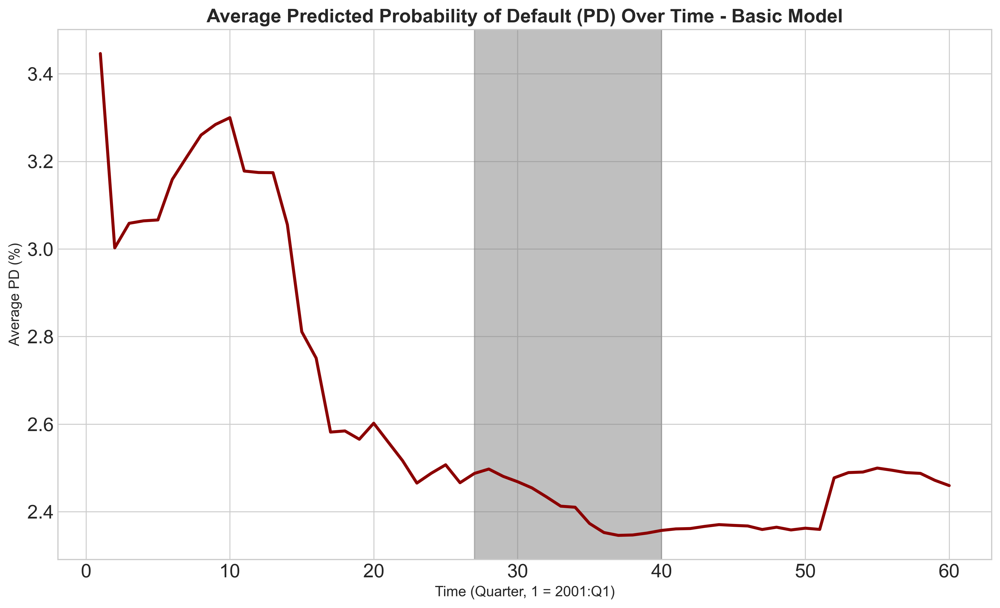

In [55]:
try:
    # Part 1: Load and Prepare the Data
    dcr_df = pd.read_csv('dcr.csv')
    model_data = dcr_df[['default_time', 'FICO_orig_time', 'LTV_orig_time', 'time']].copy()
    model_data.dropna(inplace=True)

    # Part 2: Build and Summarize the PD Model
    formula = 'default_time ~ FICO_orig_time + LTV_orig_time'
    logit_model_basic = smf.logit(formula, data=model_data).fit()
    print(logit_model_basic.summary())

    # Part 3: Calculate PD, Validate, and Plot Results
    model_data['pd_basic'] = logit_model_basic.predict(model_data)
    
    validation(model_data['pd_basic'], model_data['default_time'], model_data['time'])

    avg_pd_by_time = model_data.groupby('time')['pd_basic'].mean()

    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(14, 8))
    (avg_pd_by_time * 100).plot(linewidth=2.5, color='darkred')
    
    plt.title('Average Predicted Probability of Default (PD) Over Time - Basic Model', fontsize=16, fontweight='bold')
    plt.axvspan(27, 40, color="grey", alpha=0.5)
    plt.xlabel('Time (Quarter, 1 = 2001:Q1)', fontsize=12)
    plt.ylabel('Average PD (%)', fontsize=12)
    plt.grid(True)
    plt.show()

except Exception as e:
    print(f"An unexpected error occurred: {e}")

This first model is our starting point for understanding what makes a borrower likely to default on their mortgage. It uses only two pieces of information, both taken at the very start of the loan. It uses the borrower’s FICO score and the loan to value ratio (LTV). 
The Logit Regression results table shows that the model learned about risk. The most important parts are coefficient and P-value. The model found two very clear and statistically significant rules because their P values are 0.00, we can be very confident they are not due to random chance. The coefficient for FICO_orig_time is negative(-0.0043). This means that as a borrower's FICO score goes up, their chance of defaulting goes down. This is the most basic rule in lending. FICO score is like a financial report card that shows a person’s long history of paying their bills on time which is why the bank sees them as a very safe bet. 
The coefficient for LTV_orig_time  is positive (0.0194). This means that as the LTV ratio goes up, the chance of defaulting also goes up. The LTV is the loan amount compared to the house price which shows how much of their own money the borrower has invested. A high LTV means the borrower made a very small down payment and has little skin in the game if house prices fall or they face financial trouble, they have less to lose by simply walking away from the mortgage. A borrower with a low LTV like 60% has a large amount of their own money tied up in the house and so will try much harder to avoid a foreclosure. The model correctly identifies this as a major risk factor. The two graphs produced by the validation function helps us visualize how well the model works.
For the first graph the ROC curve shows the model’s strength. A score of 0.6153 is quite decent for such a simple model. It tells us that the model is effective at its primary job which is ranking borrowers. It can successfully select the high risk individuals from the low risk ones based on their FICO and LTV. 
However the second graph reveals the model’s critical weakness. This plot shows the average predicted default risk for the entire loan portfolio over time. The line is almost completely flat. It stays at the same low level from 2001 all the way through the 2008 global financial crisis and beyond. Economically, this is a major failure. It is well known that defaults skyrocketed around 2008. The reason the graph fails to see this is that it is blind to the economy. It only knows FICO and LTV from the start of the loan. It has no information about rising unemployment or falling house prices. Since it cannot see the massive economic storm that was happening, it keeps predicting the same low level of risk. It gives a decent long term average risk investment but it's completely unable to react to economic cycles and crisis making it an incomplete tool for the lending officer. 
The final graph confirms the model's blindness to the economy. We can see that the model’s accuracy was high before the crisis but then it collapses during the 2008 GFC. This is because during the crisis many good borrowers with high FICO scores started to default because they lost their jobs. This model which only trusts the FICO scores was unable to predict this and its performance suffered badly. This shows that relying only on historical borrower information is not enough to manage risk in a changing economy.


### 2B

Data loaded and merged successfully.
Data prepared for modeling. Removed rows with missing values.
Using 61414 observations for the model.
Optimization terminated successfully.
         Current function value: 0.113172
         Iterations 8

--- Enhanced PD Model (Logit Regression Results) ---
                           Logit Regression Results                           
Dep. Variable:           default_time   No. Observations:                61414
Model:                          Logit   Df Residuals:                    61410
Method:                           MLE   Df Model:                            3
Date:                Fri, 24 Oct 2025   Pseudo R-squ.:                 0.02228
Time:                        21:16:08   Log-Likelihood:                -6950.3
converged:                       True   LL-Null:                       -7108.7
Covariance Type:            nonrobust   LLR p-value:                 2.367e-68
                     coef    std err          z      P>|z|      [0.025   

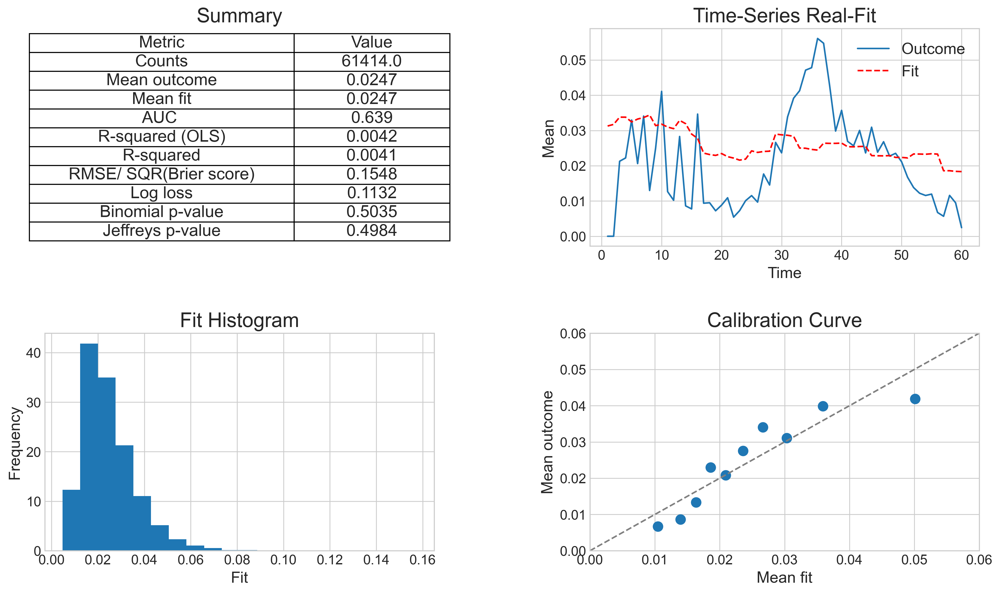

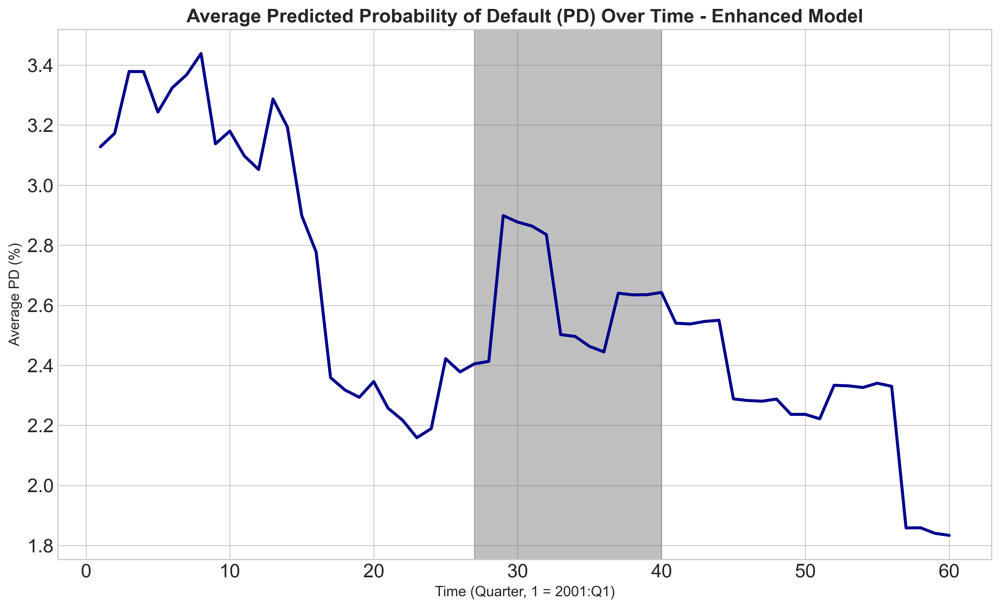

In [56]:
try:
    # Step 1: Load and Merge the Data    
    dcr_df = pd.read_csv('dcr.csv')
    quarterly_growth_df = pd.read_csv('Income_Growth.csv')    
    quarterly_growth_df.rename(columns={'Time': 'time',
                                        'State': 'state_orig_time',
                                        'Income Growth': 'income_growth'}, inplace=True)
    quarterly_growth_df.drop_duplicates(subset=['time', 'state_orig_time'], inplace=True)    
    dcr_df['state_orig_time'] = dcr_df['state_orig_time'].str.strip()
    quarterly_growth_df['state_orig_time'] = quarterly_growth_df['state_orig_time'].str.strip()    
    merged_df = pd.merge(dcr_df, quarterly_growth_df, on=['time', 'state_orig_time'], how='left')
    print("Data loaded and merged successfully.")

    # Step 2: Prepare Data for the Enhanced Model  
    model_data = merged_df[['default_time', 'FICO_orig_time', 'LTV_orig_time', 'income_growth', 'time']].copy()
    # It's crucial to remove rows with missing values to avoid missing values error.
    initial_rows = len(model_data)
    model_data.dropna(inplace=True)
    final_rows = len(model_data)
    print(f"Data prepared for modeling. Removed rows with missing values.")
    print(f"Using {final_rows} observations for the model.")


    # Step 3: Estimate the Enhanced Logit Model 
    formula = 'default_time ~ FICO_orig_time + LTV_orig_time + income_growth'  
    logit_model_enhanced = smf.logit(formula, data=model_data).fit()    
    print("\n----------- Enhanced PD Model (Logit Regression Results) -----------")
    print(logit_model_enhanced.summary()) 
    model_data['pd_enhanced'] = logit_model_enhanced.predict(model_data)
    print("\nPD calculation for all loans is complete.")

    # Step 4.5: Validate the Model    
    print("\n----------- Validation Output -----------")
    validation(model_data['pd_enhanced'], model_data['default_time'], model_data['time'])


    # Step 5: Plot the Average PD by Time    
    avg_pd_by_time = model_data.groupby('time')['pd_enhanced'].mean()

    # Step 6: Create the plot
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(14, 8))    
    (avg_pd_by_time * 100).plot(linewidth=2.5, color='darkblue')    
    plt.title('Average Predicted Probability of Default (PD) Over Time - Enhanced Model', fontsize=16, fontweight='bold')
    plt.axvspan(27, 40, color="grey", alpha=0.5)
    plt.xlabel('Time (Quarter, 1 = 2001:Q1)', fontsize=12)
    plt.ylabel('Average PD (%)', fontsize=12)
    plt.grid(True)
    plt.show()

except Exception as e:
    print(f"An unexpected error occurred: {e}")


The new regression table gives us a much more complete picture of the risk. The results for FICO_orig_time and LTV_orig_time are similar to before and still highly significant which confirms that a good credit history and large down payment always makes a borrower safer. The most important new finding here is the result of the economical variable which is the income growth. The coefficient for income growth is large and negative (-22.0972) And it's P value is 0.000 which means it is a very significant factor. In simple terms this means that as a states income growth goes down, the probability of a borrower in that state defaulting goes up by a lot this makes perfect economic sense. When a local economy shrinks, that is negative income growth which then leads to businesses closing and this leads to people losing their jobs. Losing employment is the number one reason for a person to stop paying their mortgage. For example, a borrower in a state with a booming economy and +2% income growth is far safer than an identical borrower in a state with a struggling economy and a negative 2% income growth because the second person is at a much higher risk of losing their paycheck.
From the validation function, we can see that the curve and the AUC score of 0.639 have both improved. This means the model is now even better at telling the difference between safe and risky borrowers. It not only just looks at their personal profile anymore, it's also looking at the economic environment they live in which gives it a more complete picture of their true risk. The next graph highlights the average predicted default risk over time. In our first model this line was flat and so it couldn't be used to make predictions. Now the model is able to tell a story that that is quite close to reality. The graph shows a massive spike in predicted default risk right around 2008 to 2010. The model is no longer blind and is able to see the risk of default through the income growth data. During the 2008 global financial crisis income growth across the country collapsed and went negative. The new model sees this sharp negative number and because of the strong negative coefficient it has learned to be able to correctly predict that the default risk is about to skyrocket.


### 2C

When both the models are compared the results are quite clear. The enhanced model which includes income growth is significantly better and more useful than the basic model. While the basic model is a good start the enhanced model tells a lot more of the complete and realistic story about risk.
The first realization comes from the AUC score which is a measure of how well a model can separate good borrowers from bad ones. The basic model has a good AUC of 0.6153 the enhanced model has a better AUC of 0.639. This improvement even though it might seem small is very important. It means the new model is more accurate at its main job of ranking borrowers by risk. However, the most important evidence comes from looking at the graphs that show the models predicted default rate over time. The graph for the basic model during the global financial crisis was completely flat. It predicted the same low level of risk every single year. However, for the enhanced model, the graph is completely different. It shows a massive spike in predicted default rates right around 2008 which properly lines up with what really happened during the crisis. 
The reason for this huge difference is simple. The basic model is like trying to predict if a ship will sink by looking at how well it was built and the experience of its captain. It doesn't look outside at the weather. The model knows a borrower’s FICO score which is their financial history and LTV which gives an idea about their down payment but it completely ignores the economy and has no idea if there is a massive economic storm happening or not. Therefore in 2008 when the crisis hit and millions of people lost their jobs, the basic model did not account for any of this variation and was completely surprised. It kept predicting low risk because it was only looking at the borrower's old FICO scores and not their current in hand earning capacity.
The enhanced model is much smarter because of the income data that was used to analyze the Local economy. By adding the income growth variable, the model can now account for and analyze whether the local economy is growing or shrinking. When the 2008 crisis hit, the economy went into recession and income growth became sharply negative. Since the model learned that negative income growth is strongly linked to defaults from its negative coefficient, it immediately and automatically raised its prediction for default risk for everyone.
This is why the graph for enhanced model has a huge spike in 2008. The model correctly identifies that even a borrower with a great FICO score is in serious trouble if they live in a state where the economy is collapsing and they are likely to lose their job. 


### 3A

Step 0: Loading and merging data...
Data loaded successfully.

Step 1: Filtering for default events...
Step 2: Calculating Time-to-Default...
Step 3: Calculating Time-to-Resolution...
Step 4: Recalculating LGD based on the course formula...
Step 5: Applying resolution bias correction...
Step 6: Building the OLS regression model...

--- LGD Model (OLS Regression Results) ---
                            OLS Regression Results                            
Dep. Variable:                    LGD   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.057
Method:                 Least Squares   F-statistic:                     31.62
Date:                Fri, 24 Oct 2025   Prob (F-statistic):           7.99e-20
Time:                        21:16:10   Log-Likelihood:                -293.00
No. Observations:                1515   AIC:                             594.0
Df Residuals:                    1511   BIC:                          

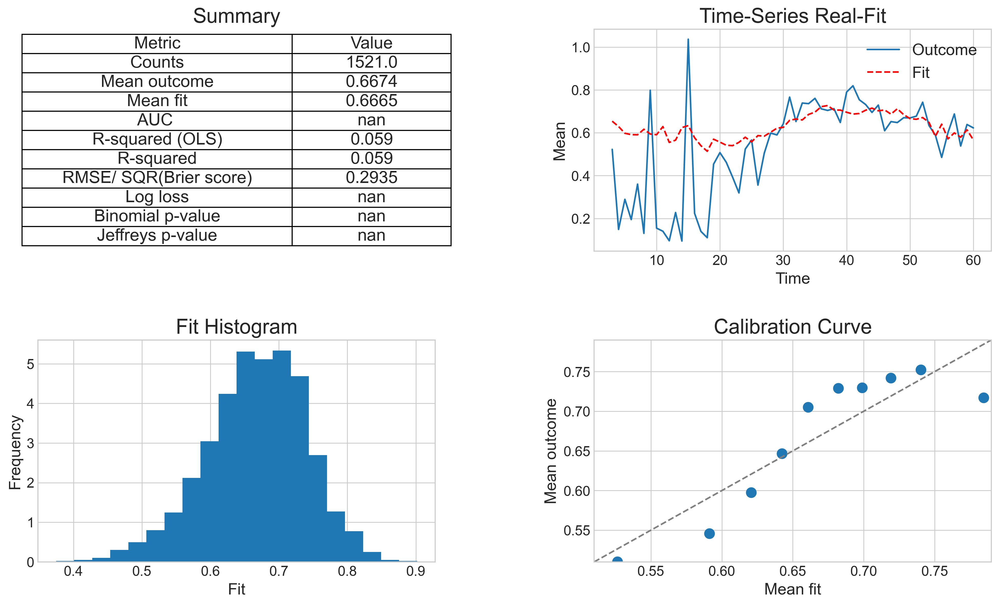


Validation complete.

Final Step: Plotting the average predicted LGD from the training/validation data...


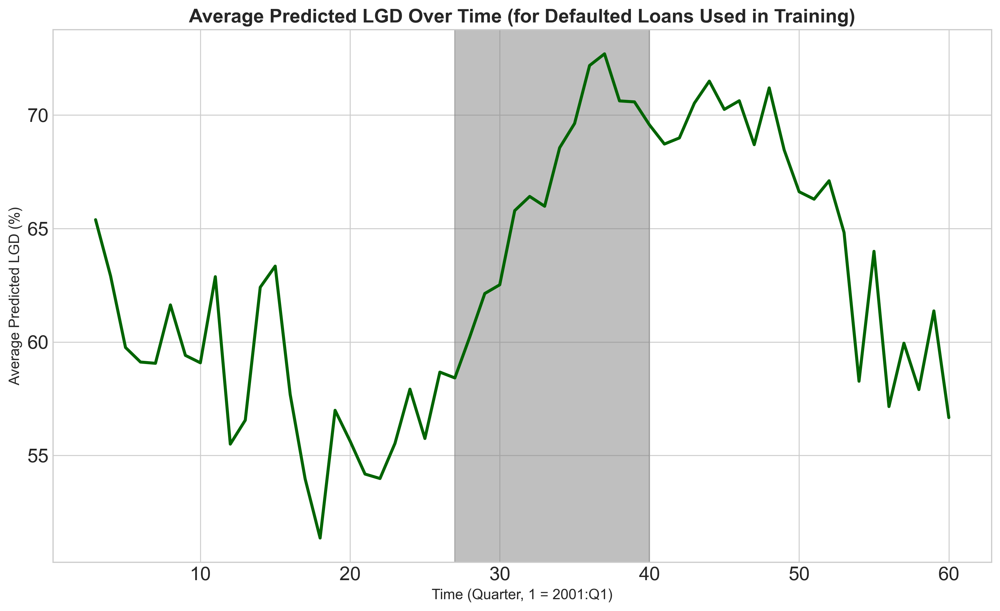

In [57]:
try:
    # Step 0: Data Preparation   
    print("Step 0: Loading and merging data...")
    dcr_data = pd.read_csv('dcr.csv')
    income_data = pd.read_csv('Income_Growth.csv')    
    income_data.rename(columns={'Time': 'time', 'State': 'state_orig_time', 'Income Growth': 'income_growth'}, inplace=True)
    income_data.drop_duplicates(subset=['time', 'state_orig_time'], inplace=True)
    dcr_data['state_orig_time'] = dcr_data['state_orig_time'].str.strip()
    income_data['state_orig_time'] = income_data['state_orig_time'].str.strip()    
    data = pd.merge(dcr_data, income_data, on=['time', 'state_orig_time'], how='left')
    print("Data loaded successfully.")

    # Step 1: Data Filtering
    print("\nStep 1: Filtering for default events...")
    data_default = data[data['default_time'] == 1].copy()

    # Step 2: Time-to-Default (TTD) Analysis
    print("Step 2: Calculating Time-to-Default...")
    data_default['ttd_period'] = data_default['time'] - data_default['orig_time']

    # Step 3: Time-to-Resolution Analysis
    print("Step 3: Calculating Time-to-Resolution...")
    data_default['res_period'] = data_default['res_time'] - data_default['time']

    # Step 4: LGD Calculation
    print("Step 4: Recalculating LGD based on the course formula...")
    data_default['LGD'] = (data_default['balance_time'] - data_default['recovery_res'] / (1 + data_default['rate_time'] / 400)**data_default['res_period']) / data_default['balance_time']

    # Step 5: Correcting for Resolution Bias
    print("Step 5: Applying resolution bias correction...")
    data_default_adjusted = resolutionbias(data_default, 'LGD', 'res_time', 'time')
    
    # Step 6: LGD Modeling with OLS Regression
    print("Step 6: Building the OLS regression model...")    
    data_default2 = data_default_adjusted[['LGD', 'LTV_time', 'FICO_orig_time', 'income_growth', 'time']].dropna()    
    model_ols = smf.ols(formula='LGD ~ LTV_time + FICO_orig_time + income_growth', data=data_default2).fit()    
    print("\n----------- LGD Model (OLS Regression Results) -----------")
    print(model_ols.summary())

    # Step 7: Validation
    print("\nStep 7: Validating the model...")
    fittedvalues = pd.DataFrame(model_ols.predict(data_default2), columns=['LGD_fit'])
    data_default3 = pd.merge(data_default2, fittedvalues, right_index=True, left_index=True)
    validation(data_default3.LGD_fit, data_default3.LGD, data_default3.time)
    print("\nValidation complete.")

    # Step 8: Create the Plot
    print("\nFinal Step: Plotting the average predicted LGD from the training/validation data...")
    avg_lgd_by_time = data_default3.groupby('time')['LGD_fit'].mean()
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(14, 8))
    (avg_lgd_by_time * 100).plot(linewidth=2.5, color='darkgreen')
    plt.title('Average Predicted LGD Over Time (for Defaulted Loans Used in Training)', fontsize=16, fontweight='bold')
    plt.axvspan(27, 40, color="grey", alpha=0.5)
    plt.xlabel('Time (Quarter, 1 = 2001:Q1)', fontsize=12)
    plt.ylabel('Average Predicted LGD (%)', fontsize=12)
    plt.grid(True)
    plt.show()


except Exception as e:
    print(f"An unexpected error occurred: {e}")



This model helps us understand how much money the bank loses if a borrower defaults on their mortgage. This loss is called loss given default or LGD. The table and graphs from our code tells a clear story about what drives this loss. It's important to know that predicting the exact loss on a single loan is very difficult and so the main goal is to understand the key factors that make losses bigger or smaller.  
To understand more about this, we use the OLS regression method. The intercept coefficient is 0.5526 this is the starting point for our loss prediction. It means that for a typical loan the bank should expect to lose about 55% of the loans value even before we consider any other forms of risk factors. This represents the basic cost of a foreclosure like legal fees and their immediate discount needed to sell a repossessed house.
The coefficient of LTV time is +0.0034. The LTV shows how much of their own money the borrower has in the house of high LTV means a small down payment. The model found that for every 10% higher the LTV is the bank’s loss increases by about 3.4% for example a loan with a 95% LTV is much riskier than a loan with an 80% LTV because the borrower has less to lose and the bank has a smaller safety cushion if the house prices fall.
The coefficient for FICO_orig_time is negative 0.003. The model found that for every 100 points higher a borrower's FICO score is, the banks loss is expected to be 3% lower. This is because a more responsible person is more likely to take care of the house even when they are in financial trouble. A well-maintained house will sell for a better price which means a smaller loss for the bank.
The coefficient for income growth is large at -1.6849. It means that when the local economy is strong that is positive income growth, then the bank’s losses are much lower. This is because in a good economy, there are lots of people looking to buy houses. So, if a bank has to foreclose, it can sell the house quickly and for a good price but in a bad economy which has negative income growth, the housing market is weak and therefore it's very hard to sell a foreclosed house due to which the bank will have to sell it at a much bigger discount leading to larger losses.
The validation graph which compares the model’s prediction to the real losses shows a wide plot of points which confirms that predicting the exact LGD for a single loan is very difficult. However the points form a clear upwards trend which means our model is working correctly on average, which is when it predicts a higher loss then the actual loss does tend to be higher.
The most important story that is told by the last graph which shows the average predicted LGD over time. This graph has a huge spike right around 2008 which is the time of the GFC. This model is working well as during the GFC, the entire economy was in a deep recession and so income growth became sharply negative across the country. At the same time, the housing market crashed. The model sees the negative income growth number and accordingly due to the strong negative rule it has learned from the model, is able to correctly predict that LGD will be much much higher during this time. The model understands that in a bad economy, the bank's losses will be severe. The fact that the graph spikes matches a major historical event proves that the model has successfully linked economical health to the bank's financial risk.


### 3B

In [58]:
try:
    # Step 0: Data Preparation    
    print("Step 0: Loading and merging data...")
    dcr_data = pd.read_csv('dcr.csv')
    income_data = pd.read_csv('Income_Growth.csv')    
    income_data.rename(columns={'Time': 'time', 'State': 'state_orig_time', 'Income Growth': 'income_growth'}, inplace=True)
    income_data.drop_duplicates(subset=['time', 'state_orig_time'], inplace=True)
    dcr_data['state_orig_time'] = dcr_data['state_orig_time'].str.strip()
    income_data['state_orig_time'] = income_data['state_orig_time'].str.strip()    
    data = pd.merge(dcr_data, income_data, on=['time', 'state_orig_time'], how='left')
    print("Data loaded successfully.")

    # Step 1: Data Filtering
    print("\nStep 1: Filtering for default events...")
    data_default = data[data['default_time'] == 1].copy()

    # Step 2: Time-to-Default (TTD) Analysis
    print("Step 2: Calculating Time-to-Default...")
    data_default['ttd_period'] = data_default['time'] - data_default['orig_time']

    # Step 3: Time-to-Resolution Analysis
    print("Step 3: Calculating Time-to-Resolution...")
    data_default['res_period'] = data_default['res_time'] - data_default['time']

    # Step 4: LGD Calculation
    print("Step 4: Recalculating LGD based on the course formula...")
    data_default['LGD'] = (data_default['balance_time'] - data_default['recovery_res'] / (1 + data_default['rate_time'] / 400)**data_default['res_period']) / data_default['balance_time']

    # Step 5: Correcting for Resolution Bias
    print("Step 5: Applying resolution bias correction...")
    data_default_adjusted = resolutionbias(data_default, 'LGD', 'res_time', 'time')
    
    # Step 6: LGD Modeling with OLS Regression (ENHANCED)
    # Create the training dataset, now including all potential predictors.
    all_features = [
        'LGD', 'time', 'LTV_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
        'REtype_CO_orig_time', 'REtype_PU_orig_time', 'REtype_SF_orig_time',
        'investor_orig_time', 'balance_orig_time', 'FICO_orig_time', 'LTV_orig_time',
        'Interest_Rate_orig_time', 'income_growth'
    ]
    data_default2 = data_default_adjusted[all_features].dropna()    
    
    formula_full = ('LGD ~ LTV_time + interest_rate_time + hpi_time + gdp_time + uer_time + '
                    'REtype_CO_orig_time + REtype_PU_orig_time + REtype_SF_orig_time + '
                    'investor_orig_time + balance_orig_time + FICO_orig_time + LTV_orig_time + '
                    'Interest_Rate_orig_time + income_growth')
    model_ols_full = smf.ols(formula=formula_full, data=data_default2).fit()
    
    print("\n----------- Full LGD Model (OLS Regression Results) -----------")
    print(model_ols_full.summary())

    # Step 7: Validation
    print("\nStep 7: Validating the enhanced model...")
    fittedvalues = pd.DataFrame(model_ols_enhanced.predict(data_default2), columns=['LGD_fit'])
    data_default3 = pd.merge(data_default2, fittedvalues, right_index=True, left_index=True)
    validation(data_default3.LGD_fit, data_default3.LGD, data_default3.time)
    print("\nValidation complete.")

except Exception as e:
    print(f"An unexpected error occurred: {e}")


Step 0: Loading and merging data...
Data loaded successfully.

Step 1: Filtering for default events...
Step 2: Calculating Time-to-Default...
Step 3: Calculating Time-to-Resolution...
Step 4: Recalculating LGD based on the course formula...
Step 5: Applying resolution bias correction...

--- Full LGD Model (OLS Regression Results) ---
                            OLS Regression Results                            
Dep. Variable:                    LGD   R-squared:                       0.115
Model:                            OLS   Adj. R-squared:                  0.107
Method:                 Least Squares   F-statistic:                     13.96
Date:                Fri, 24 Oct 2025   Prob (F-statistic):           8.06e-32
Time:                        21:16:12   Log-Likelihood:                -246.34
No. Observations:                1515   AIC:                             522.7
Df Residuals:                    1500   BIC:                             602.5
Df Model:                      

Even after a borrower has defaulted, their personal income situation still has a big impact on how much money the bank ends up losing. This might seem strange but it's because the foreclosure process isn't instant a borrower who still has some income even if it's not enough to make the full mortgage payment behaves differently than a borrower who has lost all of their income. To try and understand this through an example let's consider 2 neighbors who both default. The first neighbor loses their job and has no income. They are likely to abandon the house, stop paying for electricity and let the lawn die. The house falls into disrepair. The second neighbor takes a pay cut but still has a job. Continue to live in the house and take care of it while trying to find a solution. When the bank eventually has to sell both houses, the second well maintained house will sell for a much higher price. The bank’s loss or LGD on the second loan will be much lower simply because the borrower had an income and an incentive to care for the property. A borrower with an income has more options to help the bank. They can work with the bank on a short sale where they can help sell the house for the best possible price even if it's less than the loan amount. This is almost always better for the bank than a formal foreclosure auction. A borrower with no income has no such options which usually leads to the worst case scenario for the bank which is a long and expensive foreclosure process and a low final sale price resulting in a very high LGD.
In order to add two additional features to better predict LGD, The full model was run which tested most of the variables in the DCR file to see what else could help predict the bank's loss. Based on those results, there are two very powerful new features that are statistically significant and would make perfect economic sense.
HPI_time is a direct measure of the value of the houses in the area at the exact time the loan is being observed. The bank’s loss is all about the value of the collateral that is the house itself. This variable is the most direct signal of this value. The full model finds that this feature is highly significant with the P value of +0.0012. The positive coefficient means that in a hotter housing market which is signified by a higher HPI value, the bank's loss is surprisingly higher. This is likely because a high HPI can signal a housing bubble. When the bubble bursts, prices fall very quickly. If a default happens during this crash the bank’s loss will be much higher. The key is that HPI_time directly measures the health of the housing market. It's a much more precise signal than a general economic indicator. For a lender, this is crucial as knowing the state of the local housing market is the most important factor in predicting how much money they can make from a foreclosure.
Uer_time Is the unemployment rate in the area at the time of loan observation. A high unemployment rate is a direct sign of a weak local economy. The full model found that this feature is also highly significant with the P value of 0.025. The positive coefficient means that when unemployment is high, the bank's loss is also higher. This makes perfect logical sense as when many people in an area are out of work there are fewer potential buyers for houses. The bank can't sell a foreclosed property easily. To attract a buyer, they will have to slash the prices which leads to a bigger loss. For a lender, this is a clear warning sign. A rising unemployment rate in a region signals that not only will more people default but the losses on those defaults will be much worse because the pool of potential buyers for the foreclosed homes is also shrinking.
While the full model highlighted several other significant factors, hpi_time and uer_time were chosen because they are the most direct and powerful external economic drivers of LGD other significant variables like interest_rate_time (higher rates can reduce buyer demand) and balance_orig_time (larger loans may have lower LGD rates) are also important. However, the housing price index is a direct measure of the collateral value and the unemployment rate is a direct measure of local economic distress and the pool of potential home buyers. These two factors capture the fundamental market conditions at the time of default more directly than any other variable, making them the most crucial additions for improving the model. 


### 4

Step 1: Loading and preparing data...

Step 2: Predicting PD and LGD using models from previous questions...
PD and LGD prediction complete.

Step 3: Calculating and plotting Expected Loss...


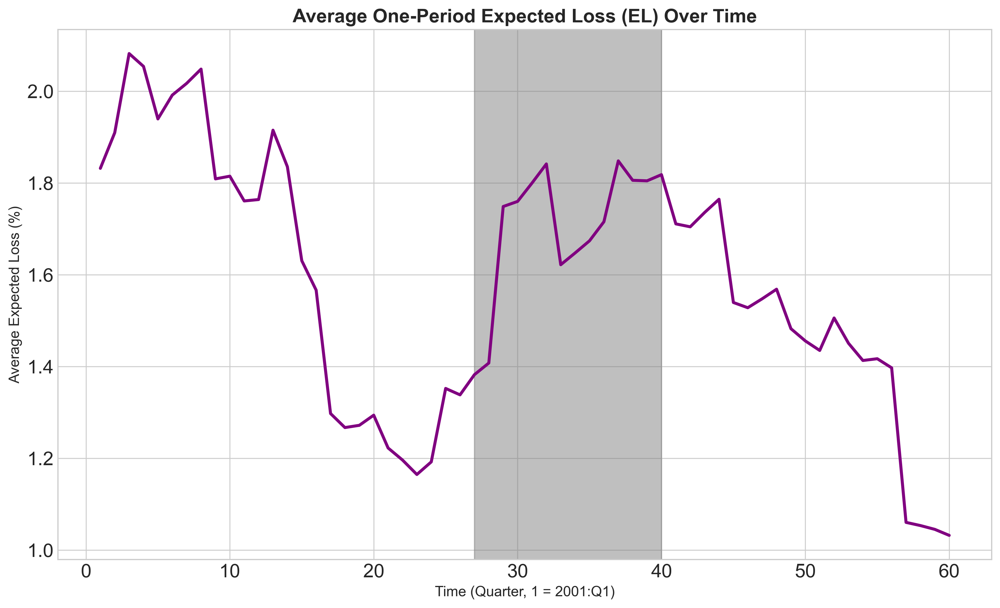

In [59]:
try:
    # Step 1: Load and Prepare Data for Prediction
    print("Step 1: Loading and preparing data...")
    dcr_df = pd.read_csv('dcr.csv')
    quarterly_growth_df = pd.read_csv('Income_Growth.csv')
    quarterly_growth_df.rename(columns={'Time': 'time', 'State': 'state_orig_time', 'Income Growth': 'income_growth'}, inplace=True)
    quarterly_growth_df.drop_duplicates(subset=['time', 'state_orig_time'], inplace=True)
    dcr_df['state_orig_time'] = dcr_df['state_orig_time'].str.strip()
    quarterly_growth_df['state_orig_time'] = quarterly_growth_df['state_orig_time'].str.strip()    
    master_df = pd.merge(dcr_df, quarterly_growth_df, on=['time', 'state_orig_time'], how='left')   

    # Step 2: Predict PD and LGD from 2B and 3A
    print("\nStep 2: Predicting PD and LGD using models from previous questions...")    
    master_df['pd_predicted'] = logit_model_enhanced.predict(master_df)   
    master_df['lgd_predicted'] = model_ols.predict(master_df)   
    print("PD and LGD prediction complete.")
    
    # Step 3: Calculate and Plot Expected Loss
    print("\nStep 3: Calculating and plotting Expected Loss...")    
    master_df['EL'] = master_df['pd_predicted'] * master_df['lgd_predicted']   # Calculate Expected Loss (EAD is assumed to be 1). 
    el_by_time = master_df.groupby('time')['EL'].mean()
    
    # Step 4: Plot the results.
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(14, 8))    
    (el_by_time * 100).plot(linewidth=2.5, color='purple')    
    plt.title('Average One-Period Expected Loss (EL) Over Time', fontsize=16, fontweight='bold')
    plt.axvspan(27, 40, color="grey", alpha=0.5)
    plt.xlabel('Time (Quarter, 1 = 2001:Q1)', fontsize=12)
    plt.ylabel('Average Expected Loss (%)', fontsize=12)
    plt.grid(True)
    plt.show()

except Exception as e:
    print(f"An unexpected error occurred: {e}")



The final step in our risk analysis is to calculate the Expected Loss (EL).  This is the most important number for a bank because it Combines the chance of a borrower defaulting with the amount of money the bank will lose if they do. The simple formula is Expected Loss (EL) = Probability of Default (PD) x Loss Given Default (LGD). This calculation has been performed for every loan in every quarter and then the average for the entire portfolio was plotted.
The graph for the average expected loss tells a very clear story. For the first several years, the line is low and flat which represents a period of economic calm and stability. However right around 2008 which has been highlighted by the gray bar, the line suddenly spikes to an extremely high level before slowly coming down. This spike is the 2008 global financial crisis and the graph shows us exactly why it was so devastating for banks. The reason the EL spiked is that two bad things happened at the same time creating a perfect storm of risk. First, more people defaulted because the economy went into a deep recession. As seen in the PD model, income growth was negative, meaning people were losing jobs and could no longer afford their mortgages. This caused the Probability of Default (PD) for everyone in the portfolio to go way up. Second, the losses on each of those defaults were much bigger. As seen in the LGD model, when income growth is negative, the economy is weak and house prices fall. This meant that when the bank had to foreclose on a house, the house was now worth much less than the loan amount, causing the Loss Given Default (LGD) to also go way up.
The most important lesson from the graph is that risk multiplies. In good times, the chance of default is very low and the loss on that default is manageable, so the total expected loss is low. For example, a 1% chance of default multiplied by a 30% loss is also a 0.3% expected loss. But in a crisis, the chance of default becomes much higher and the loss on each default also becomes much higher. A 5% chance of default is multiplied by a 70% loss which results in a 3.5% expected loss which is more than ten times larger. The danger that a single bad economic event can cause both the frequency and the severity of losses to spike at the same time. For a bank, this is the most dangerous scenario. This analysis proves that the biggest threat isn’t just a few risky borrowers, the biggest threat is a major economic downturn that makes the entire loan portfolio much riskier all at once. This is why modern banking rules require banks to do stress tests using models like these to make sure they can survive a storm similar to what was show in the graph here.

### 5A, 5B & 5C

----------- Starting Question 5A: Climate and Income Growth Analysis -----------
Step 1.1: Loading and preparing yearly data files...

Step 1.2: Building a model for the entire US...

----------- Linear Regression Model for the Entire US -----------
                            OLS Regression Results                            
Dep. Variable:          income_growth   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                 -0.069
Method:                 Least Squares   F-statistic:                   0.09226
Date:                Fri, 24 Oct 2025   Prob (F-statistic):              0.766
Time:                        21:37:25   Log-Likelihood:                 39.764
No. Observations:                  15   AIC:                            -75.53
Df Residuals:                      13   BIC:                            -74.11
Df Model:                           1                                         
Covariance Type:            nonrobust  

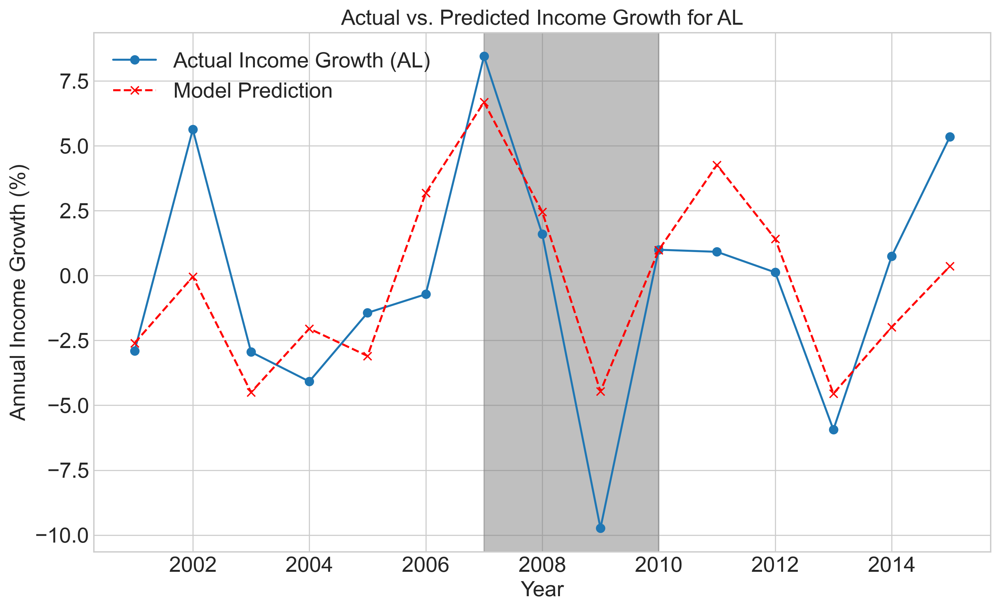

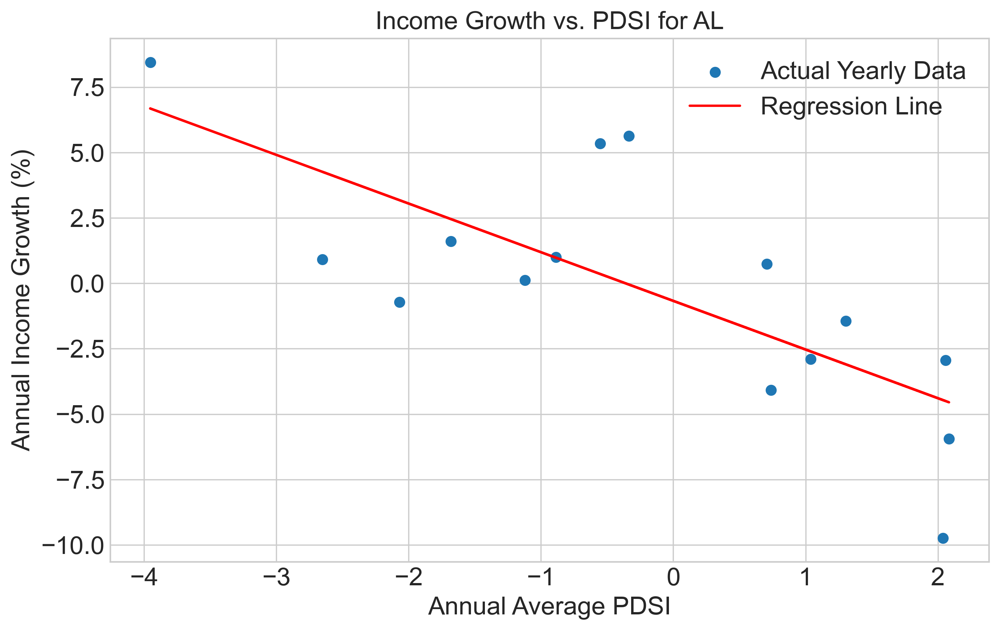


----------- Processing 5A for State: TN -----------

Step 1.4: Building a detailed model for 'TN'...

----------- Linear Regression Model for TN -----------
                            OLS Regression Results                            
Dep. Variable:          income_growth   R-squared:                       0.143
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     2.174
Date:                Fri, 24 Oct 2025   Prob (F-statistic):              0.164
Time:                        21:37:25   Log-Likelihood:                 28.765
No. Observations:                  15   AIC:                            -53.53
Df Residuals:                      13   BIC:                            -52.11
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

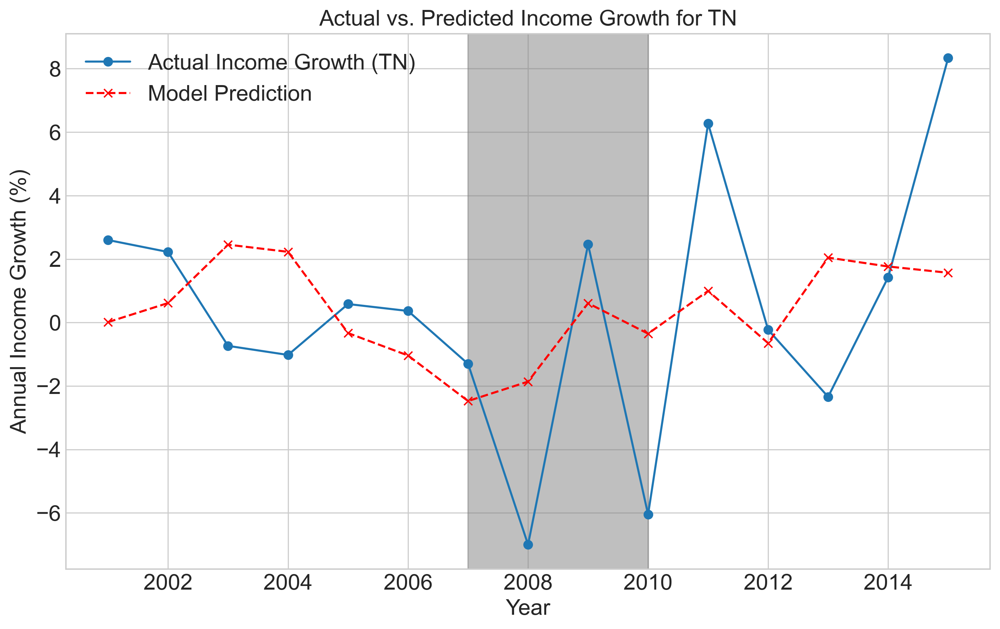

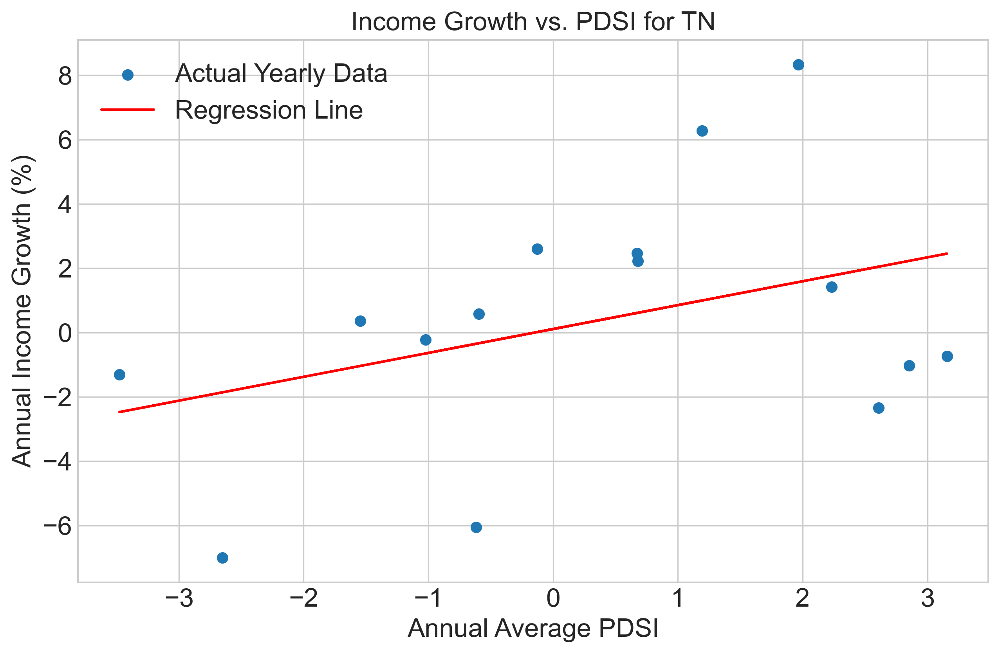


----------- Processing 5A for State: GA -----------

Step 1.4: Building a detailed model for 'GA'...

----------- Linear Regression Model for GA -----------
                            OLS Regression Results                            
Dep. Variable:          income_growth   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.077
Method:                 Least Squares   F-statistic:                  0.001607
Date:                Fri, 24 Oct 2025   Prob (F-statistic):              0.969
Time:                        21:37:26   Log-Likelihood:                 25.625
No. Observations:                  15   AIC:                            -47.25
Df Residuals:                      13   BIC:                            -45.83
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

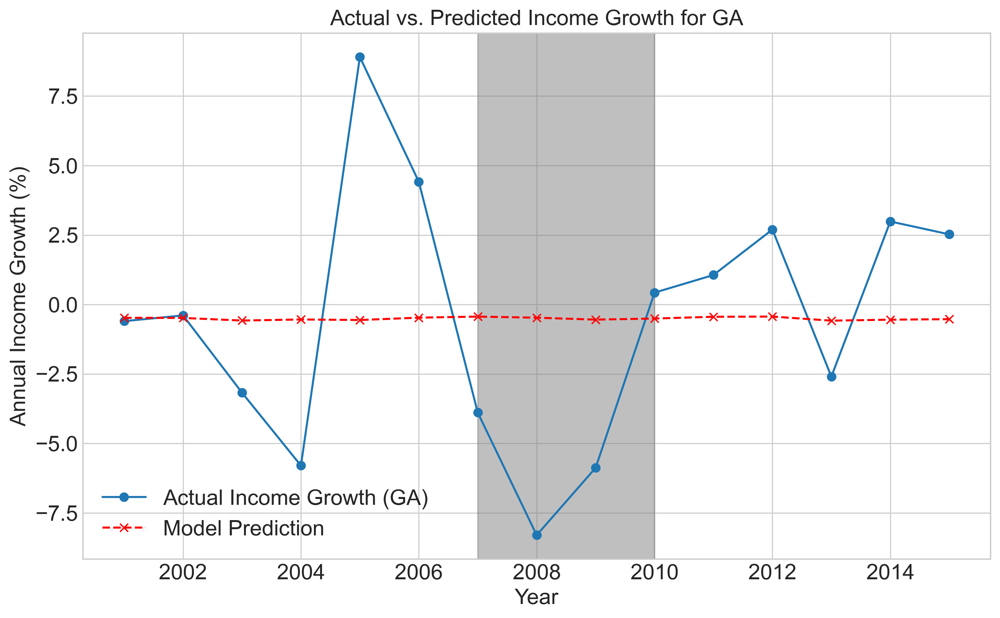

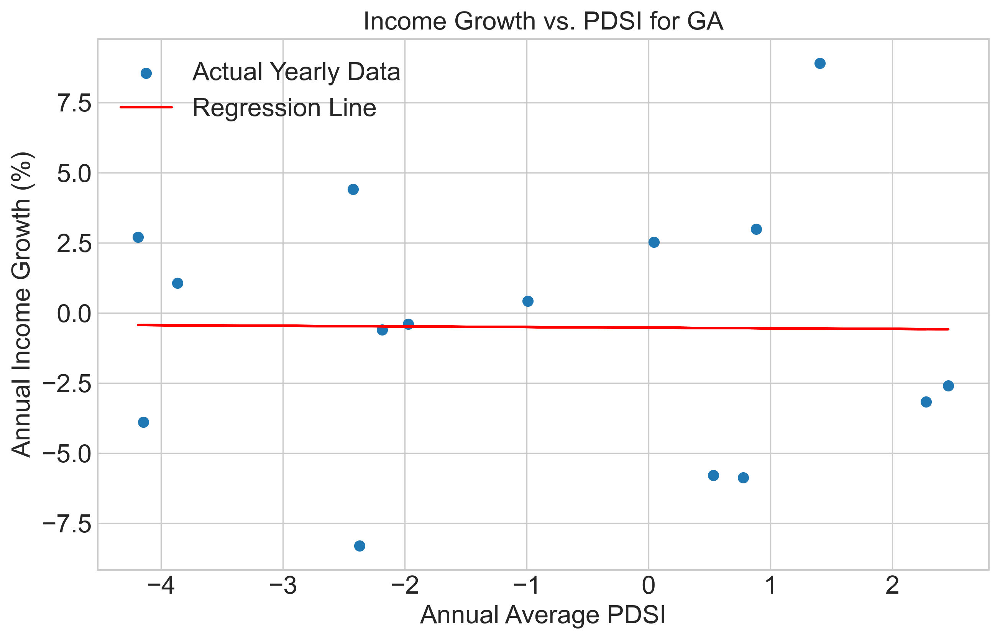


----------- Processing 5A for State: FL -----------

Step 1.4: Building a detailed model for 'FL'...

----------- Linear Regression Model for FL -----------
                            OLS Regression Results                            
Dep. Variable:          income_growth   R-squared:                       0.116
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     1.711
Date:                Fri, 24 Oct 2025   Prob (F-statistic):              0.214
Time:                        21:37:27   Log-Likelihood:                 28.265
No. Observations:                  15   AIC:                            -52.53
Df Residuals:                      13   BIC:                            -51.11
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

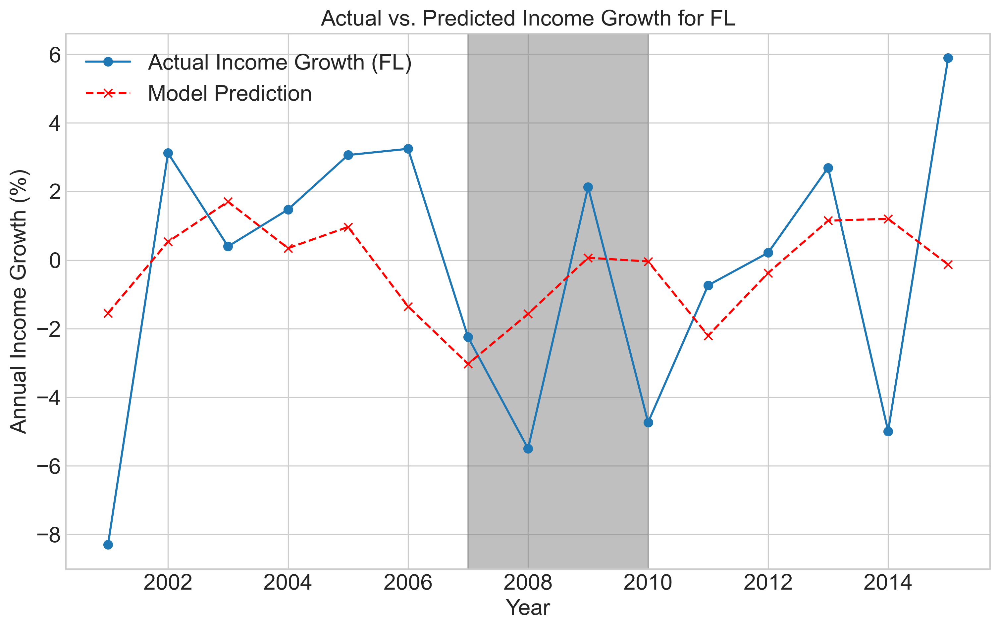

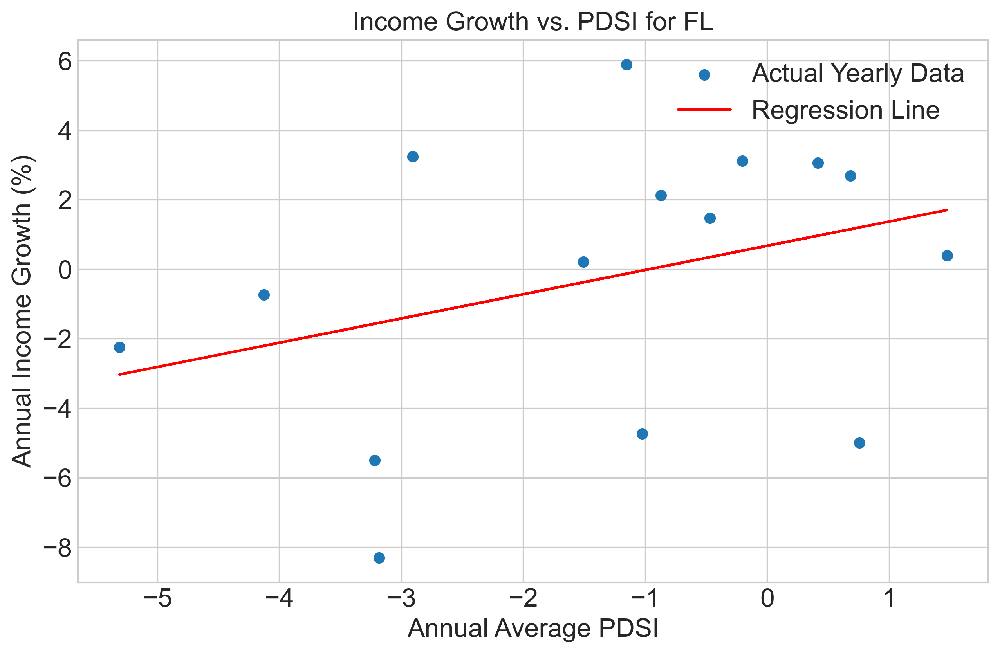


----------- Processing 5A for State: MS -----------

Step 1.4: Building a detailed model for 'MS'...

----------- Linear Regression Model for MS -----------
                            OLS Regression Results                            
Dep. Variable:          income_growth   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.060
Method:                 Least Squares   F-statistic:                    0.2026
Date:                Fri, 24 Oct 2025   Prob (F-statistic):              0.660
Time:                        21:37:28   Log-Likelihood:                 15.981
No. Observations:                  15   AIC:                            -27.96
Df Residuals:                      13   BIC:                            -26.55
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|

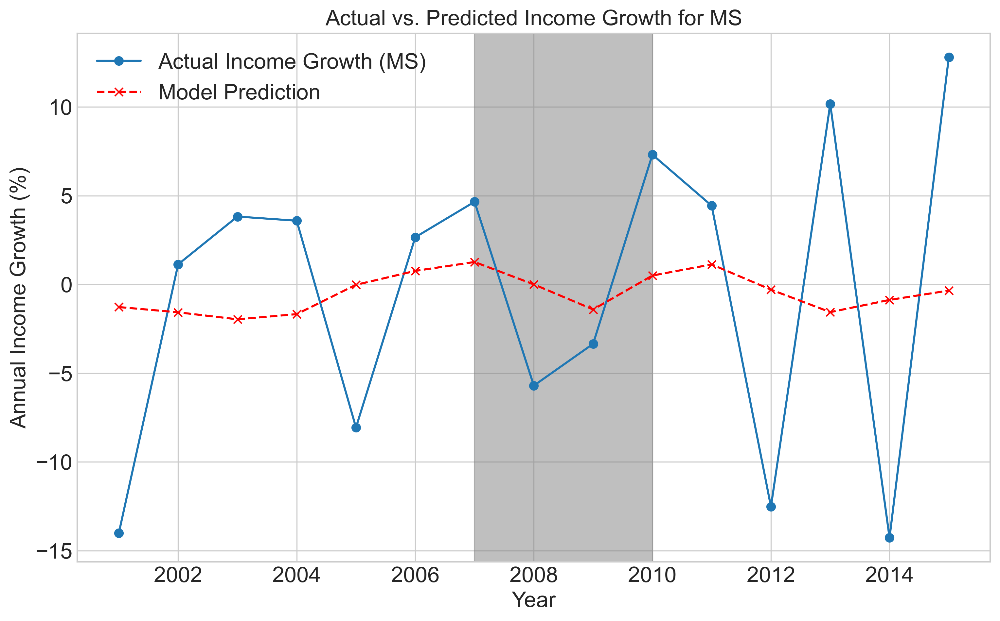

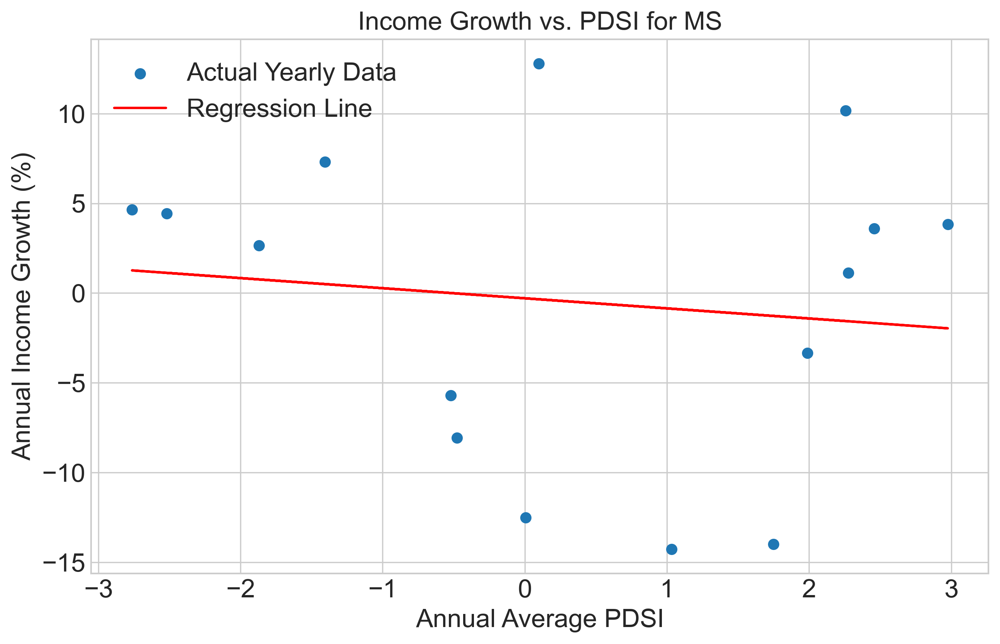


----------- Question 5A Complete -----------


----------- Starting Question 5B: Climate Feature Prediction -----------

----------- Processing 5B for State: AL -----------
Step 2.1: Building a model to find the historical climate trend for AL...
Trend model built successfully.

Step 2.2: Generating the PDSI forecast for AL (2016-2045)...

----------- PDSI Forecast for AL (2016-2045) -----------
 Year  Predicted_PDSI
 2016       -0.261667
 2017       -0.246078
 2018       -0.230490
 2019       -0.214902
 2020       -0.199314
 2021       -0.183725
 2022       -0.168137
 2023       -0.152549
 2024       -0.136961
 2025       -0.121373
 2026       -0.105784
 2027       -0.090196
 2028       -0.074608
 2029       -0.059020
 2030       -0.043431
 2031       -0.027843
 2032       -0.012255
 2033        0.003333
 2034        0.018922
 2035        0.034510
 2036        0.050098
 2037        0.065686
 2038        0.081275
 2039        0.096863
 2040        0.112451
 2041        0.128039
 2042 

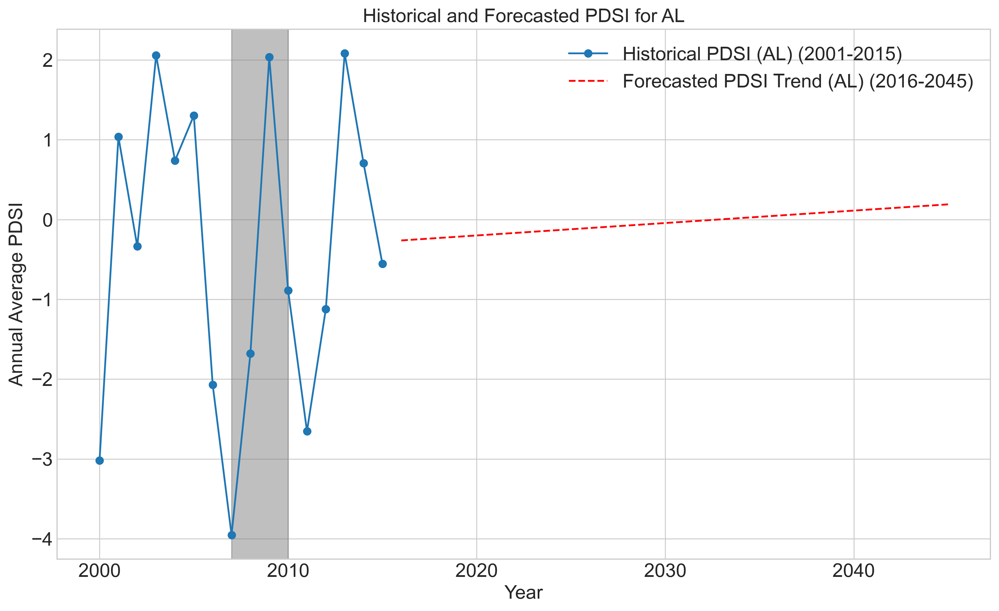


----------- Processing 5B for State: TN -----------
Step 2.1: Building a model to find the historical climate trend for TN...
Trend model built successfully.

Step 2.2: Generating the PDSI forecast for TN (2016-2045)...

----------- PDSI Forecast for TN (2016-2045) -----------
 Year  Predicted_PDSI
 2016        1.138375
 2017        1.251529
 2018        1.364684
 2019        1.477838
 2020        1.590993
 2021        1.704147
 2022        1.817301
 2023        1.930456
 2024        2.043610
 2025        2.156765
 2026        2.269919
 2027        2.383074
 2028        2.496228
 2029        2.609382
 2030        2.722537
 2031        2.835691
 2032        2.948846
 2033        3.062000
 2034        3.175154
 2035        3.288309
 2036        3.401463
 2037        3.514618
 2038        3.627772
 2039        3.740926
 2040        3.854081
 2041        3.967235
 2042        4.080390
 2043        4.193544
 2044        4.306699
 2045        4.419853

Step 2.3: Creating a plot to visualize

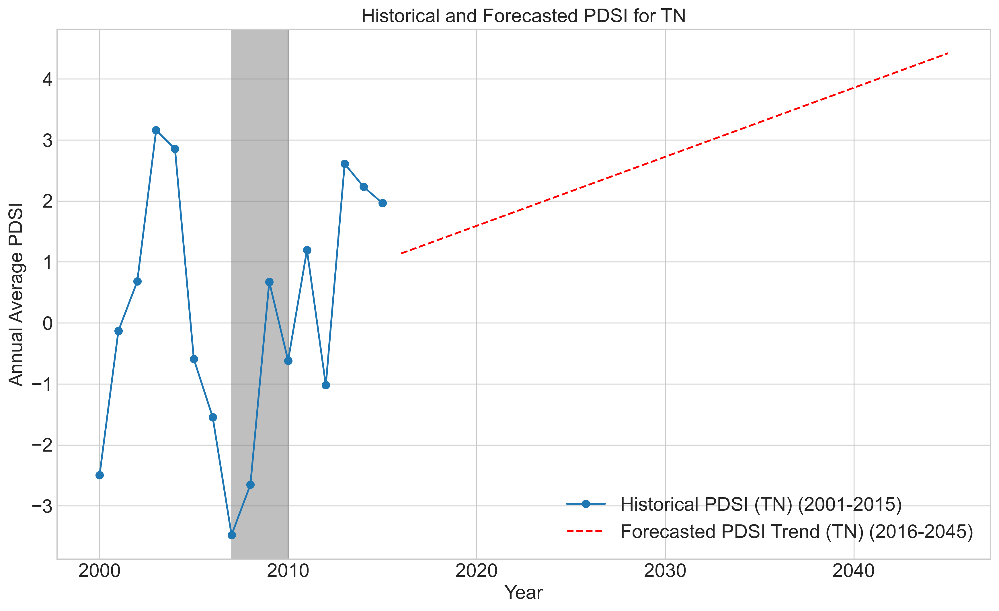


----------- Processing 5B for State: GA -----------
Step 2.1: Building a model to find the historical climate trend for GA...
Trend model built successfully.

Step 2.2: Generating the PDSI forecast for GA (2016-2045)...

----------- PDSI Forecast for GA (2016-2045) -----------
 Year  Predicted_PDSI
 2016       -0.388000
 2017       -0.304382
 2018       -0.220765
 2019       -0.137147
 2020       -0.053529
 2021        0.030088
 2022        0.113706
 2023        0.197324
 2024        0.280941
 2025        0.364559
 2026        0.448176
 2027        0.531794
 2028        0.615412
 2029        0.699029
 2030        0.782647
 2031        0.866265
 2032        0.949882
 2033        1.033500
 2034        1.117118
 2035        1.200735
 2036        1.284353
 2037        1.367971
 2038        1.451588
 2039        1.535206
 2040        1.618824
 2041        1.702441
 2042        1.786059
 2043        1.869676
 2044        1.953294
 2045        2.036912

Step 2.3: Creating a plot to visualize

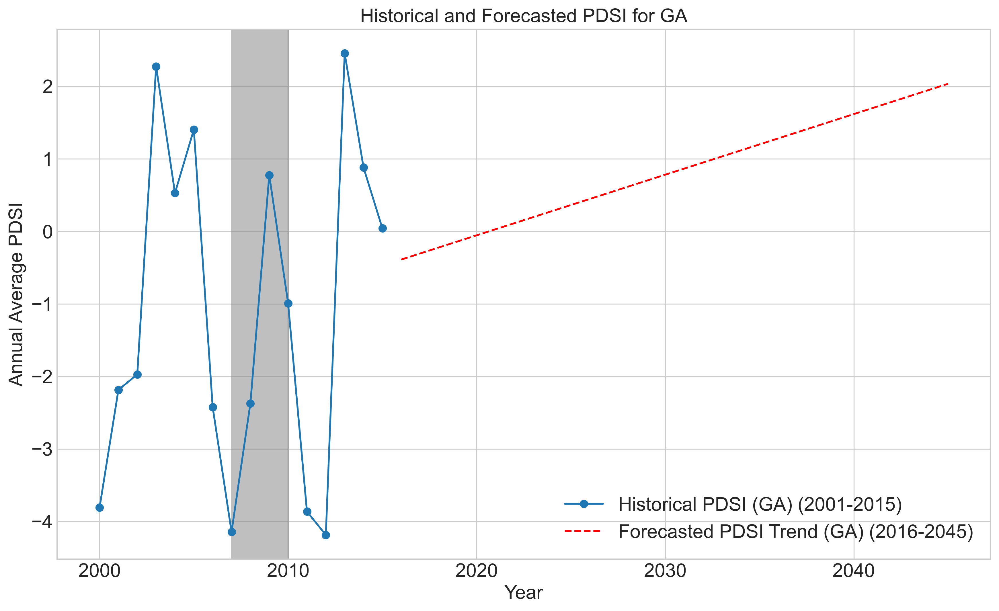


----------- Processing 5B for State: FL -----------
Step 2.1: Building a model to find the historical climate trend for FL...
Trend model built successfully.

Step 2.2: Generating the PDSI forecast for FL (2016-2045)...

----------- PDSI Forecast for FL (2016-2045) -----------
 Year  Predicted_PDSI
 2016       -0.935437
 2017       -0.866978
 2018       -0.798518
 2019       -0.730059
 2020       -0.661599
 2021       -0.593140
 2022       -0.524680
 2023       -0.456221
 2024       -0.387761
 2025       -0.319301
 2026       -0.250842
 2027       -0.182382
 2028       -0.113923
 2029       -0.045463
 2030        0.022996
 2031        0.091456
 2032        0.159915
 2033        0.228375
 2034        0.296835
 2035        0.365294
 2036        0.433754
 2037        0.502213
 2038        0.570673
 2039        0.639132
 2040        0.707592
 2041        0.776051
 2042        0.844511
 2043        0.912971
 2044        0.981430
 2045        1.049890

Step 2.3: Creating a plot to visualize

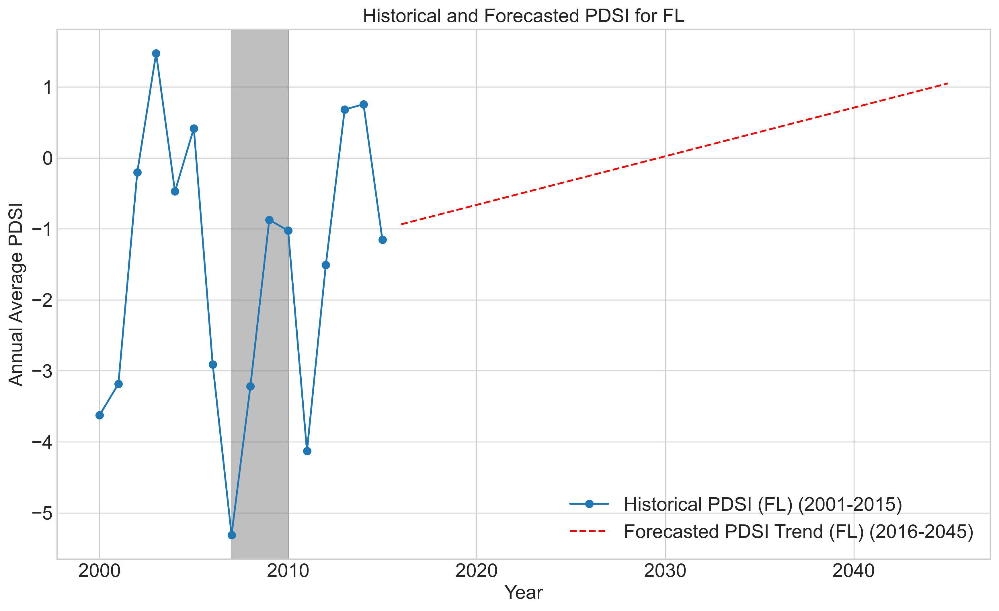


----------- Processing 5B for State: MS -----------
Step 2.1: Building a model to find the historical climate trend for MS...
Trend model built successfully.

Step 2.2: Generating the PDSI forecast for MS (2016-2045)...

----------- PDSI Forecast for MS (2016-2045) -----------
 Year  Predicted_PDSI
 2016       -0.037458
 2017       -0.057962
 2018       -0.078466
 2019       -0.098969
 2020       -0.119473
 2021       -0.139977
 2022       -0.160480
 2023       -0.180984
 2024       -0.201488
 2025       -0.221991
 2026       -0.242495
 2027       -0.262999
 2028       -0.283502
 2029       -0.304006
 2030       -0.324510
 2031       -0.345013
 2032       -0.365517
 2033       -0.386021
 2034       -0.406525
 2035       -0.427028
 2036       -0.447532
 2037       -0.468036
 2038       -0.488539
 2039       -0.509043
 2040       -0.529547
 2041       -0.550050
 2042       -0.570554
 2043       -0.591058
 2044       -0.611561
 2045       -0.632065

Step 2.3: Creating a plot to visualize

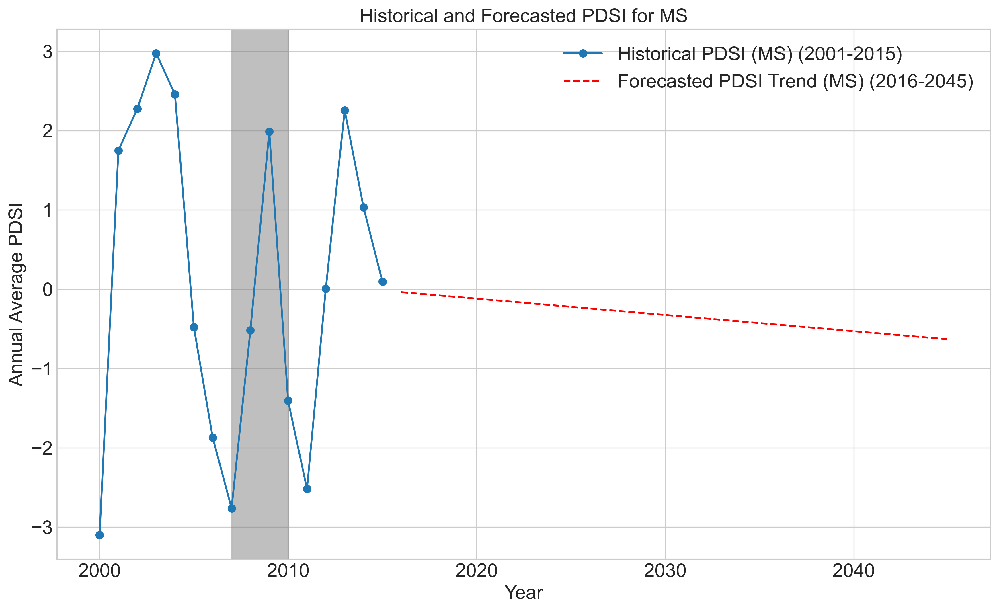


----------- Question 5B Complete -----------


----------- Starting Question 5C: Lifetime PD and LGD Forecast -----------
Step 3.1: Re-training the general PD and LGD models...
- Enhanced PD model is trained.
- Full LGD model is trained.

----------- Processing 5C for State: AL -----------

Step 3.2: Creating the 30-year forecast scenario for AL...

Step 3.3: Calculating and plotting the lifetime PD and LGD...

----------- Forecasted Lifetime Risk Profile for AL -----------
 year  pd_forecast  lgd_forecast
 2016     0.029460      0.623218
 2017     0.029643      0.623707
 2018     0.029828      0.624195
 2019     0.030014      0.624684
 2020     0.030201      0.625172
 2021     0.030390      0.625661
 2022     0.030579      0.626150
 2023     0.030770      0.626638
 2024     0.030961      0.627127
 2025     0.031154      0.627615
 2026     0.031348      0.628104
 2027     0.031543      0.628593
 2028     0.031740      0.629081
 2029     0.031937      0.629570
 2030     0.032136      0

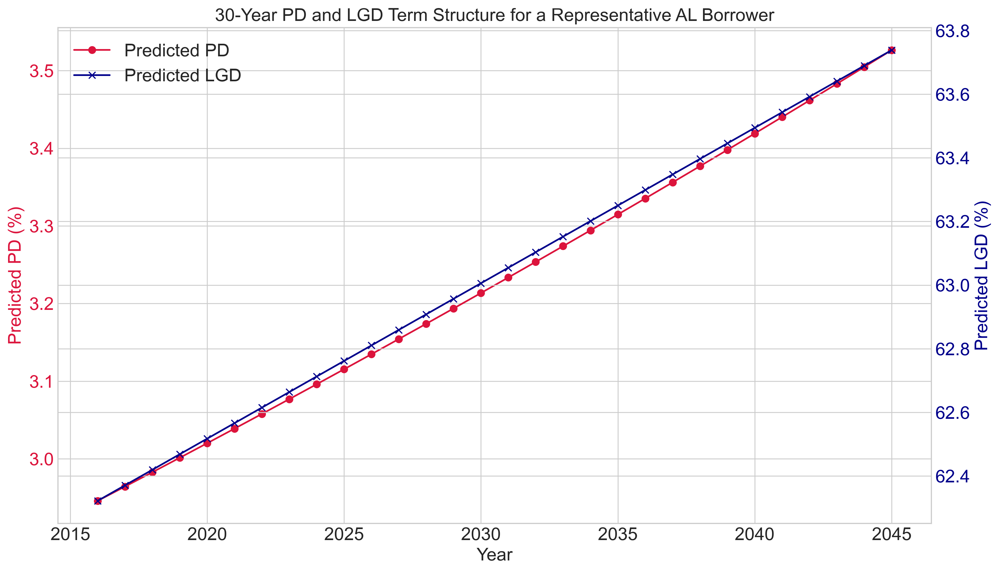


----------- Processing 5C for State: TN -----------

Step 3.2: Creating the 30-year forecast scenario for TN...

Step 3.3: Calculating and plotting the lifetime PD and LGD...

----------- Forecasted Lifetime Risk Profile for TN -----------
 year  pd_forecast  lgd_forecast
 2016     0.023350      0.602021
 2017     0.022931      0.600605
 2018     0.022518      0.599189
 2019     0.022113      0.597772
 2020     0.021715      0.596356
 2021     0.021324      0.594940
 2022     0.020939      0.593524
 2023     0.020562      0.592108
 2024     0.020191      0.590691
 2025     0.019827      0.589275
 2026     0.019469      0.587859
 2027     0.019118      0.586443
 2028     0.018773      0.585026
 2029     0.018434      0.583610
 2030     0.018101      0.582194
 2031     0.017773      0.580778
 2032     0.017452      0.579362
 2033     0.017136      0.577945
 2034     0.016826      0.576529
 2035     0.016522      0.575113
 2036     0.016223      0.573697
 2037     0.015929      0.572280


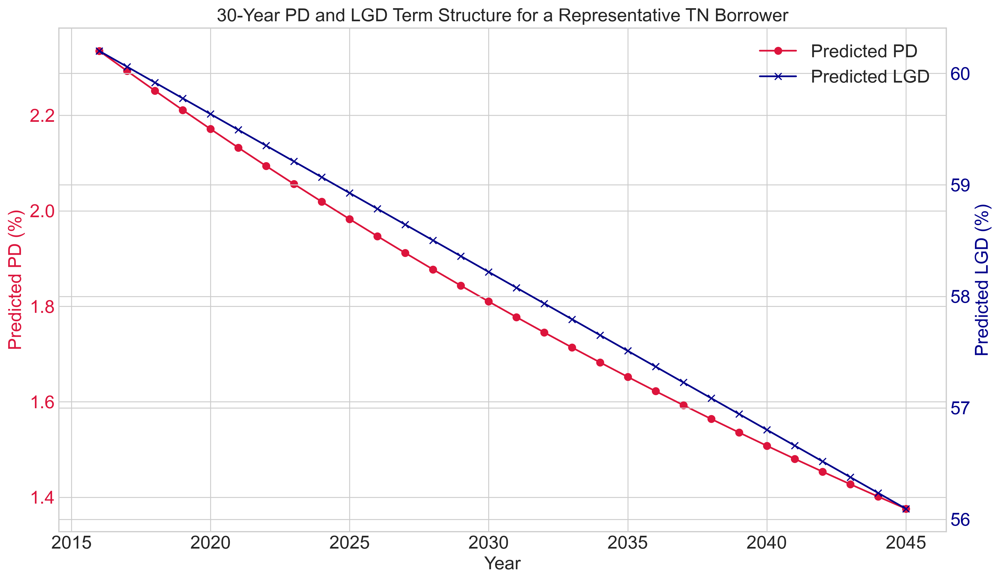


----------- Processing 5C for State: GA -----------

Step 3.2: Creating the 30-year forecast scenario for GA...

Step 3.3: Calculating and plotting the lifetime PD and LGD...

----------- Forecasted Lifetime Risk Profile for GA -----------
 year  pd_forecast  lgd_forecast
 2016     0.024572      0.598909
 2017     0.024582      0.598940
 2018     0.024592      0.598971
 2019     0.024602      0.599002
 2020     0.024612      0.599033
 2021     0.024621      0.599065
 2022     0.024631      0.599096
 2023     0.024641      0.599127
 2024     0.024651      0.599158
 2025     0.024661      0.599189
 2026     0.024670      0.599220
 2027     0.024680      0.599251
 2028     0.024690      0.599282
 2029     0.024700      0.599313
 2030     0.024710      0.599345
 2031     0.024720      0.599376
 2032     0.024729      0.599407
 2033     0.024739      0.599438
 2034     0.024749      0.599469
 2035     0.024759      0.599500
 2036     0.024769      0.599531
 2037     0.024779      0.599562


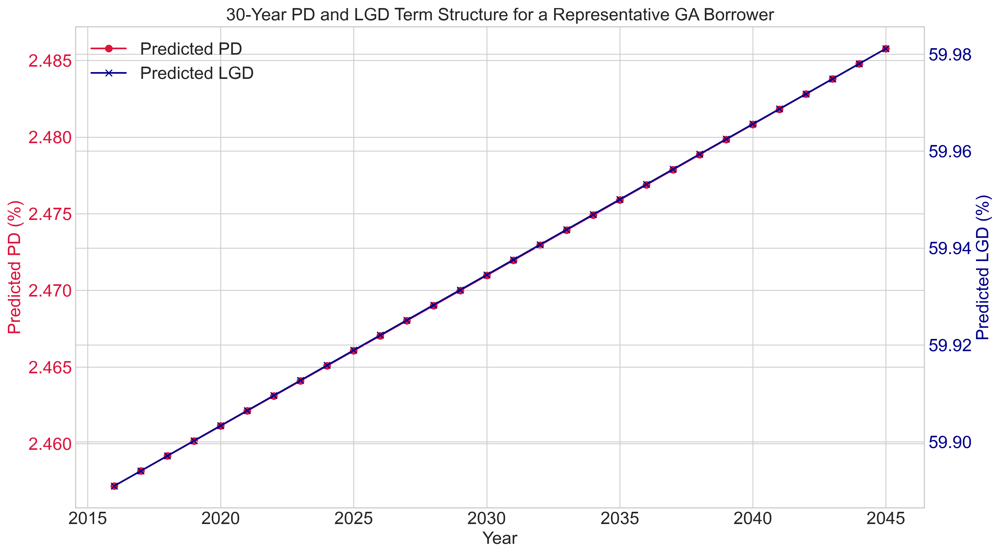


----------- Processing 5C for State: FL -----------

Step 3.2: Creating the 30-year forecast scenario for FL...

Step 3.3: Calculating and plotting the lifetime PD and LGD...

----------- Forecasted Lifetime Risk Profile for FL -----------
 year  pd_forecast  lgd_forecast
 2016     0.021689      0.586409
 2017     0.021466      0.585605
 2018     0.021245      0.584800
 2019     0.021027      0.583995
 2020     0.020811      0.583191
 2021     0.020597      0.582386
 2022     0.020385      0.581582
 2023     0.020176      0.580777
 2024     0.019968      0.579973
 2025     0.019763      0.579168
 2026     0.019559      0.578363
 2027     0.019358      0.577559
 2028     0.019159      0.576754
 2029     0.018961      0.575950
 2030     0.018766      0.575145
 2031     0.018573      0.574341
 2032     0.018381      0.573536
 2033     0.018192      0.572732
 2034     0.018004      0.571927
 2035     0.017819      0.571122
 2036     0.017635      0.570318
 2037     0.017453      0.569513


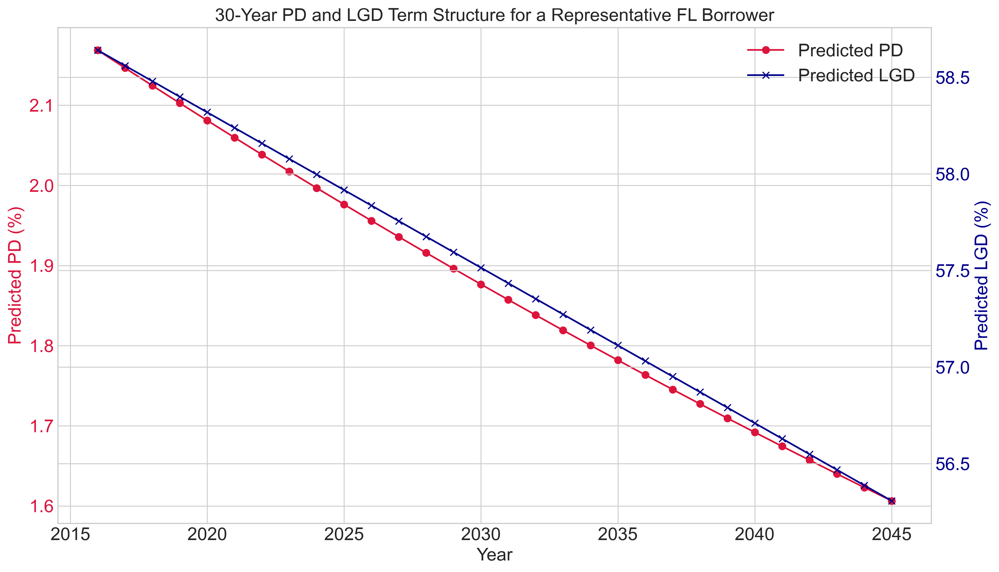


----------- Processing 5C for State: MS -----------

Step 3.2: Creating the 30-year forecast scenario for MS...

Step 3.3: Calculating and plotting the lifetime PD and LGD...

----------- Forecasted Lifetime Risk Profile for MS -----------
 year  pd_forecast  lgd_forecast
 2016     0.031967      0.630438
 2017     0.031888      0.630244
 2018     0.031810      0.630049
 2019     0.031731      0.629855
 2020     0.031653      0.629660
 2021     0.031575      0.629466
 2022     0.031497      0.629272
 2023     0.031420      0.629077
 2024     0.031342      0.628883
 2025     0.031265      0.628689
 2026     0.031188      0.628494
 2027     0.031111      0.628300
 2028     0.031034      0.628106
 2029     0.030957      0.627911
 2030     0.030881      0.627717
 2031     0.030805      0.627523
 2032     0.030729      0.627328
 2033     0.030653      0.627134
 2034     0.030577      0.626940
 2035     0.030502      0.626745
 2036     0.030427      0.626551
 2037     0.030352      0.626357


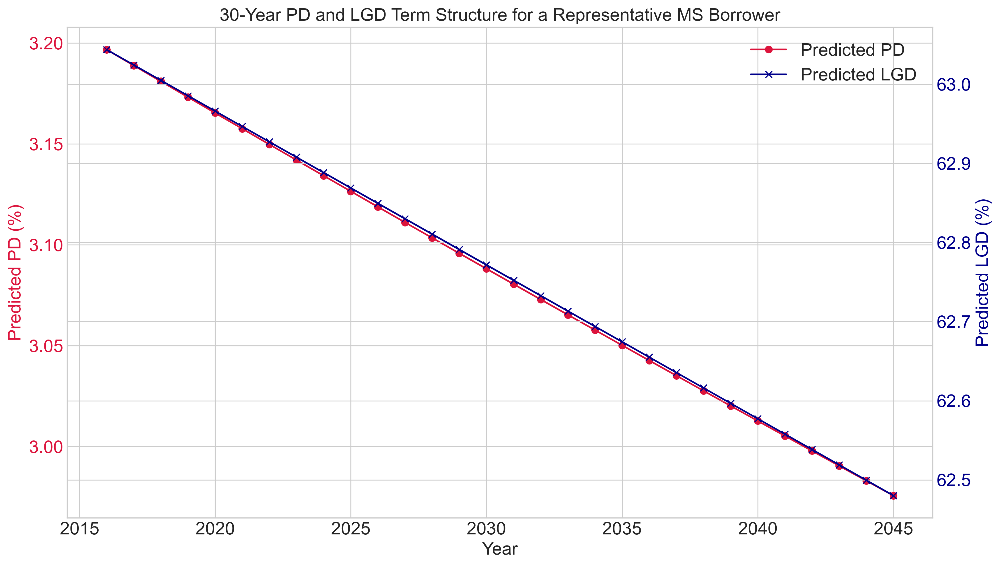


----------- Question 5C Complete -----------


In [66]:
# ----------- Define States of Interest -----------
states_of_interest = ['AL', 'TN', 'GA', 'FL', 'MS']
# Dictionaries to store state-specific models and forecasts
income_climate_models = {} #5A
pdsi_trend_models = {} #5B
pdsi_forecasts = {} #5C


try:
    
    # ----------- Part 1: Analysis of Climate and Income Growth (Question 5A) -----------    
    print("----------- Starting Question 5A: Climate and Income Growth Analysis -----------")
    
    # ----------- Step 1.1: Prepare Yearly Data -----------
    print("Step 1.1: Loading and preparing yearly data files...")
    # Load the yearly income growth and PDSI data.
    yearly_income_growth = pd.read_csv('yearly_Income_Growth.csv')
    yearly_pdsi = pd.read_csv('yearly_pdsi_2001_2015_US.csv')
    
    # ----------- Step 1.2: National-Level Analysis -----------
    print("\nStep 1.2: Building a model for the entire US...")    
    national_income_growth = yearly_income_growth.groupby('Year')['Income_Growth'].mean()    
    national_pdsi_by_year = yearly_pdsi.groupby('Year')['PDSI'].mean()    
    national_model_df = pd.merge(national_income_growth, national_pdsi_by_year, left_index=True, right_index=True)   
    national_model_df_renamed = national_model_df.rename(columns={'Income_Growth': 'income_growth'})    
    national_model = smf.ols(formula='income_growth ~ PDSI', data=national_model_df_renamed).fit()    
    print("\n----------- Linear Regression Model for the Entire US -----------")
    print(national_model.summary())
    print("\nObservation: The national model is not statistically significant.")

    # ----------- Step 1.3: State-Level Correlation Analysis -----------
    print("\nStep 1.3: Analyzing individual states...")    
    yearly_income_growth['State'] = yearly_income_growth['State'].str.strip()
    yearly_pdsi['State'] = yearly_pdsi['State'].str.strip()    
    annual_data = pd.merge(yearly_income_growth, yearly_pdsi, on=['State', 'Year'])
    annual_data_renamed = annual_data.rename(columns={'Income_Growth': 'income_growth'})   
    correlation_table = annual_data_renamed.groupby('State')[['income_growth', 'PDSI']].corr(numeric_only=True).unstack().iloc[:, 1]
    correlation_table = correlation_table.reset_index(name='Correlation')
    correlation_table['Abs_Correlation'] = correlation_table['Correlation'].abs()
    sorted_correlation_table = correlation_table.sort_values(by='Abs_Correlation', ascending=False)    
    print("\n----------- Correlation Between Income Growth and PDSI (All States) -----------")
    print(sorted_correlation_table[['State', 'Correlation']].to_string(index=False))

    # ----------- Steps 1.4 & 1.5: Build, Analyze, and Plot Models for States of Interest -----------
    
    for state_code in states_of_interest:
        print(f"\n----------- Processing 5A for State: {state_code} -----------")
        
        # ----------- Step 1.4: Build and Analyze the Model -----------
        print(f"\nStep 1.4: Building a detailed model for '{state_code}'...")        
        model_df_5a = annual_data_renamed[annual_data_renamed['State'] == state_code].copy()            
        model_df_5a.set_index('Year', inplace=True)               
        income_climate_model = smf.ols(formula='income_growth ~ PDSI', data=model_df_5a).fit()
        income_climate_models[state_code] = income_climate_model # Store the model        
        print(f"\n----------- Linear Regression Model for {state_code} -----------")
        print(income_climate_model.summary())

        # ----------- Step 1.5: Plot the Results -----------
        print(f"\nStep 1.5: Creating plots for '{state_code}'...")
        model_df_5a['income_growth_fit'] = income_climate_model.predict(model_df_5a)
        
        # Time Series Plot
        plt.figure(figsize=(12, 7))
        plt.plot(model_df_5a.index, model_df_5a['income_growth'] * 100, marker='o', label=f'Actual Income Growth ({state_code})')
        plt.plot(model_df_5a.index, model_df_5a['income_growth_fit'] * 100, marker='x', linestyle='--', color='red', label='Model Prediction')
        plt.title(f'Actual vs. Predicted Income Growth for {state_code}', fontsize=16)
        plt.axvspan(2007, 2010, color="grey", alpha=0.5)
        plt.xlabel('Year')
        plt.ylabel('Annual Income Growth (%)')
        plt.legend()
        plt.grid(True)
        plt.show()
        
        # Scatter Plot
        plt.figure(figsize=(10, 6))
        plt.scatter(model_df_5a['PDSI'], model_df_5a['income_growth'] * 100, label='Actual Yearly Data')
        plt.plot(model_df_5a['PDSI'], model_df_5a['income_growth_fit'] * 100, color='red', label='Regression Line')
        plt.title(f'Income Growth vs. PDSI for {state_code}', fontsize=16)
        plt.xlabel('Annual Average PDSI'); plt.ylabel('Annual Income Growth (%)'); plt.legend(); plt.grid(True); plt.show()

    print("\n----------- Question 5A Complete -----------")

    
    # ----------- Part 2: Climate Feature Prediction (Question 5B) -----------
    
    print("\n\n----------- Starting Question 5B: Climate Feature Prediction -----------")
    
    for state_code in states_of_interest:
        print(f"\n----------- Processing 5B for State: {state_code} -----------")

        # ----------- Step 2.1: Build a Model to Find the Historical Trend -----------
        print(f"Step 2.1: Building a model to find the historical climate trend for {state_code}...")        
        state_pdsi_annual = yearly_pdsi[yearly_pdsi['State'] == state_code].copy()        
        trend_model = smf.ols('PDSI ~ Year', data=state_pdsi_annual).fit()
        pdsi_trend_models[state_code] = trend_model # Store the model
        print("Trend model built successfully.")

        # ----------- Step 2.2: Generate the Future Forecast -----------
        print(f"\nStep 2.2: Generating the PDSI forecast for {state_code} (2016-2045)...")        
        future_years_df = pd.DataFrame({'Year': range(2016, 2046)})        
        future_pdsi = trend_model.predict(future_years_df)        
        forecast_df = pd.DataFrame({'Year': future_years_df['Year'], 'Predicted_PDSI': future_pdsi})
        pdsi_forecasts[state_code] = forecast_df # Store the forecast        
        print(f"\n----------- PDSI Forecast for {state_code} (2016-2045) -----------")
        print(forecast_df.to_string(index=False))

        # ----------- Step 2.3: Plot the Historical Data and the Forecast -----------
        print("\nStep 2.3: Creating a plot to visualize the forecast...")
        plt.figure(figsize=(14, 8))
        plt.plot(state_pdsi_annual['Year'], state_pdsi_annual['PDSI'], marker='o', label=f'Historical PDSI ({state_code}) (2001-2015)')
        plt.plot(forecast_df['Year'], forecast_df['Predicted_PDSI'], linestyle='--', color='red', label=f'Forecasted PDSI Trend ({state_code}) (2016-2045)')
        plt.title(f'Historical and Forecasted PDSI for {state_code}', fontsize=16)
        plt.axvspan(2007, 2010, color="grey", alpha=0.5)
        plt.xlabel('Year')
        plt.ylabel('Annual Average PDSI')
        plt.legend()
        plt.grid(True)
        plt.show()

    print("\n----------- Question 5B Complete -----------")

    
    # ----------- Part 3: Lifetime PD and LGD Forecast (Question 5C) -----------
    
    print("\n\n----------- Starting Question 5C: Lifetime PD and LGD Forecast -----------")
    
    # ----------- Step 3.1: Re-train the Main PD and LGD Models -----------
    print("Step 3.1: Re-training the general PD and LGD models...")    
    dcr_df = pd.read_csv('dcr.csv')
    quarterly_growth_df = pd.read_csv('Income_Growth.csv')    
    quarterly_growth_df.rename(columns={'Time': 'time', 'State': 'state_orig_time', 'Income Growth': 'income_growth'}, inplace=True)
    quarterly_growth_df.drop_duplicates(subset=['time', 'state_orig_time'], inplace=True)
    dcr_df['state_orig_time'] = dcr_df['state_orig_time'].str.strip()
    quarterly_growth_df['state_orig_time'] = quarterly_growth_df['state_orig_time'].str.strip()
    master_df = pd.merge(dcr_df, quarterly_growth_df, on=['time', 'state_orig_time'], how='left')
    
    # Train the PD Model
    pd_model_data = master_df.dropna(subset=['default_time', 'FICO_orig_time', 'LTV_orig_time', 'income_growth']).copy()
    pd_model = smf.logit('default_time ~ FICO_orig_time + LTV_orig_time + income_growth', data=pd_model_data).fit(disp=0)
    print("- Enhanced PD model is trained.")
    
    # Train the LGD Model
    data_default = master_df[master_df['default_time'] == 1].copy()
    data_default['res_period'] = data_default['res_time'] - data_default['time']
    data_default['LGD'] = (data_default['balance_time'] - data_default['recovery_res'] / (1 + data_default['rate_time'] / 400)**data_default['res_period']) / data_default['balance_time']
    data_default_adjusted = resolutionbias(data_default, 'LGD', 'res_time', 'time')   
    lgd_training_data = data_default_adjusted[['LGD', 'LTV_time', 'FICO_orig_time', 'income_growth']].dropna()
    lgd_model = smf.ols(formula='LGD ~ LTV_time + FICO_orig_time + income_growth', data=lgd_training_data).fit()
    print("- Full LGD model is trained.")

    # ----------- Steps 3.2 & 3.3: Create Scenarios and Forecasts for States of Interest -----------
    
    for state_code in states_of_interest:
        print(f"\n----------- Processing 5C for State: {state_code} -----------")
            
        # ----------- Step 3.2: Create the Future Scenario for a Representative Borrower -----------
        print(f"\nStep 3.2: Creating the 30-year forecast scenario for {state_code}...")
        # Define the borrower.
        state_loans = dcr_df[dcr_df['state_orig_time'] == state_code]            
        avg_fico = state_loans['FICO_orig_time'].mean()
        avg_ltv = state_loans['LTV_orig_time'].mean()        
        state_income_model = income_climate_models[state_code]        
        state_pdsi_forecast = pdsi_forecasts[state_code]['Predicted_PDSI']        
        future_income_growth = state_income_model.predict(pd.DataFrame({'PDSI': state_pdsi_forecast}))        
        
        scenario_df = pd.DataFrame({
            'year': pdsi_forecasts[state_code]['Year'],
            'FICO_orig_time': avg_fico,
            'LTV_orig_time': avg_ltv,
            'LTV_time': avg_ltv,
            'income_growth': future_income_growth
        })

        # ----------- Step 3.3: Calculate and Plot the Lifetime Risk Forecast -----------
        print("\nStep 3.3: Calculating and plotting the lifetime PD and LGD...")
        # Use our trained models to predict on the future scenario.
        scenario_df['pd_forecast'] = pd_model.predict(scenario_df)
        scenario_df['lgd_forecast'] = lgd_model.predict(scenario_df)
        scenario_df['lgd_forecast'] = np.clip(scenario_df['lgd_forecast'], 0, 1)

        print(f"\n----------- Forecasted Lifetime Risk Profile for {state_code} -----------")
        print(scenario_df[['year', 'pd_forecast', 'lgd_forecast']].to_string(index=False))
        
        # Plot the results.
        fig, ax1 = plt.subplots(figsize=(14, 8))
        ax1.plot(scenario_df['year'], scenario_df['pd_forecast'] * 100, color='crimson', marker='o', label='Predicted PD')
        ax1.set_xlabel('Year'); ax1.set_ylabel('Predicted PD (%)', color='crimson'); ax1.tick_params(axis='y', labelcolor='crimson')
        ax2 = ax1.twinx()
        ax2.plot(scenario_df['year'], scenario_df['lgd_forecast'] * 100, color='darkblue', marker='x', label='Predicted LGD')
        ax2.set_ylabel('Predicted LGD (%)', color='darkblue'); ax2.tick_params(axis='y', labelcolor='darkblue')
        plt.title(f'30-Year PD and LGD Term Structure for a Representative {state_code} Borrower', fontsize=16)
        lines, labels = ax1.get_legend_handles_labels(); lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='best')
        ax1.grid(True)
        plt.show()

    print("\n----------- Question 5C Complete -----------")

except (FileNotFoundError, NameError) as e:
    print(f"\nAn error occurred: {e}")
    


The analysis begins with a broad question, does climate impact the economy? The first instinct was to test this for the entire United States. A bottle was first constructed to test this for the entire United States linking national income growth to a national average of the Palmer Drought Severity Index (PDSI). The result of this national level model was a statistical failure. Its R-squared was near zero (0.007) And the P value was insignificant (0.766). This failure is by itself a key economic finding because it proves that The United states economy is not just one single uniform entity. It is a collection of 50 different local economies.  Severe drought hurting farms in Kansas might happen concurrently with an economic boom in other sectors or regions. When these diverse local stories are averaged into a single national number, the true economic signals are obscured and cancel each other out.
This discovery required abandoning the national view to instant analyze each state individually for a calculation of the correlation between income growth and PDSI for all states confirmed the theory that the relationships were completely different everywhere this proves that the economic impact of a climate is a hyperlocal story defined by the specific industry composition of each state. From this list the focus shifted to Alabama (AL) due it extremely high correlation with PDSI and its geographic neighbors Tennessee (TN), Georgia (GA), Florida (FL), and Mississippi (MS) to analyze if similar Impact can be see across neighboring states. It might be expected that states in such close proximity would behave similarly but the data revealed the exact opposite painting a fascinating picture of the diverse southern economy.
Alabama presented the most striking case. It had an incredibly strong negative correlation of -0.742 the detailed model for Alabama was highly successful with a strong R square of 0.551 and a P value of 0.002 making the result statistically significant. The models coefficient for PDSI was minus 0.0186. This means that in Alabama wetter weather (higher PDSI) Is linked to lower income growth while drier weather is linked to higher growth. This counterintuitive finding makes perfect economic sense for Alabama specific economy. A large part of its economy relies on forestry, timber and heavy industry. When there is excessive rain, the ground becomes saturated and heavy logging equipment cannot operate, potentially shutting down a major source of income.  As a gulf state, extremely high PSI (very wet) is often associated with destructive hurricanes and tropical storms which caused massive economic damage and a logical drop in income .
Georgia despite bordering Alabama, shows a completely different economic story. It's correlation was minus 0.011, effectively zero. The model for Georgia confirmed this producing an R-squared of 0.00 and a P value of 0.969. This indicates that there is no relationship between these variables. The reason lies in the local economy. Georgia's economy which is majorly centered on Atlanta is a diversified powerhouse of logistics, finance, technology and corporate headquarters. These service based industries are almost completely insulated from local weather patterns a drought or a rainy month does not stop banks from processing loans or logistic companies from managing supply chains.
Florida and Tennessee both showed a positive relationship, the opposite of Alabama. Florida's correlation was 0.341 and Tennessee’s was 0.379. While their individual statistical models lack significance as PDSI alone might not be enough to significant explain income growth, the direction of the relationship is economically important. Florida’s economy is dominated by tourism and agriculture (e.g. citrus). For this economy, the primary climate threat is drought (a low PDSI) which can devastate crops and increase wildfire risks therefore stable wetter weather (a higher PDSI)  Is an economic positive. Similarly, Tennessee has a large agricultural sector and heavy manufacturing like automotive plants that rely on stable water sources, making drought the primary economic enemy.
Mississippi showed a very weak negative correlation of -0.124 and its corresponding model was also statistically insignificant its economy has elements of both Alabama which is forestry and Tennessee which is agriculture. The fact that the signal is so weak suggests that for Mississippi, other economic factors such as the national price of cotton or soybean are far more important drivers of income than this single climate measure. In summary, the analysis in part 5A demonstrates that there is no single uniform climate risk. Alabama's economy is hurt by rain, Florida’s is hurt by drought and Georgia’s is largely unaffected. To understand climate risk, one must first understand the local industrial economy.
Predicting future economic risks first required a prediction of the future climate. This was accomplished by building a simple trend model for each state examining the historical PDSI from 2001 to 2015 and extending that trend line forward 30 years to 2045. The result indicated two different potential futures. For Alabama, Tennessee, Georgia and Florida, the historical data showed a trend towards wetter weather due to the fact that the models forecast a steady increase in PDSI over the next 30 years. Mississippi was the outlier showing a slight drying trend with its PDSI forecast to decrease. The climate forecast represents the first link in the overall risk prediction chain.
Predicting 30 your risk for a representative borrower is the final step connecting all elements of the analysis. The objective is to determine what happens to the risk of a 30 year mortgage loan given these climate and economic forecasts. Models were built to link a borrower's Probability of Default (PD) and the bank’s Loss Given Default) (LGD) Two economic income growth. The logic is straightforward which is when income growth is high, people have jobs, and so can pay their mortgages and hence house prices are strong. This leads to low PD and low LGD. When income growth is low, job losses increase, defaults rise and house prices fall, leading to high PD and high LGD.
A chain reaction can then be constructed for each state. This chain reaction begins with the 30 year climate forecast from part 5B. This forecast is fed into the state specific climate income model from part 5A which in turn predicts 30 years of income growth. Then this income growth forecast is fed into the primary risk models to predict the 30 year PD and LGD. The results are dramatically different for each state. For Alabama, the story is the clearest and most concerning. The climate is forecast to get wetter (PDSI is rising). The economic model knows that for Alabama wetter weather is bad for income leads to a forecast of a steady decline in income growth. Lower income growth in turn means higher risk. The resulting graph for Alabama shoes the PD and LGD lines trending upwards for 30 years. A lender would normally expect a 30 year loan to become safer over time but this model warns that for a typical Alabama borrower the loan may become progressively riskier due to the projected long-term economic drag from this specific climate trend.
Florida and Tennessee show the opposite effect. Their climates are also forecast to get wetter (PDSI is rising). However their economic models believe that for these states, wetter weather is good for income this leads to a forecast of a steady increase in income growth which implies lower risk. The resulting graph for both Florida and Tennessee show the PD and LGD lines trending downwards. This suggests that for these states whose economies are harmed by drought, A better future could actually be an economic positive reducing credit risk for lenders over the long term.
Georgia acts as a control group in this analysis. It's climate is forecast to get better but its economic model dictates that the climate has no impact on its income. This results in a forecast of no change in income growth and therefore no change in risk assessment from just this specific climate indicator. The resulting graph for Georgia is almost perfectly flat. This economically demonstrates that for a state with a highly diversified, service based economy, this specific climate risk is not a major factor and the loans risk profile remain stable. However it is important to note that this risk assessment cannot be taken into account as it is built using PDSI which does not have significant impact on its income growth.
Mississippi's case combines two different factors. Its climate is forecast to get drier (PDSI is falling). Its economic model, though weak, has a negative coefficient, suggesting wetter is bad for income which is similar to Alabama. This combination of a double negative where a drier trend combined with a model that says wetter is bad Results in a prediction of higher income growth. Higher income growth implies lower risk. The resulting graph for Mississippi shows a downward trend in PD and LGD suggesting that if its economy is indeed structured like Alabama’s, a future drier trend would be an economic benefit thus lowering credit risk over the life of the loan.
